# Iordache Adrian-Razvan, Artificial Intelligence, 407

# Modules and Packages

In [1]:
import os
import glob
import math
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

plt.style.use('seaborn-poster')
VERBOSE = 1

# Task 1 - Counting Red and Yellow Stones in Curling 

### Problem Description

Task1 - this directory contains 25 training images showing the red and yellow stones
on the ice surface in a constrained scenario. 

In this scenario, each image shows The House from above. The Task1 consists in correctly counting how many stones are on the ice surface and how many of these stones are red and yellow. 

The format that you need to follow is the one used in the ground-truth files (located in the subdirectory ground-truth) with the first line containing the total number of stones and the second and third lines containing the number of red and yellow stones.

### Grading scheme for Task-1

In the test scenario we will release 25 testing images similar with the training images. 

By correctly solving the Task1 on all images you will get 1.5 points. You get 0.03 points/image if your algorithm counts correctly the number of stones in the image (if the first line in your output file is correct) and another 0.03 points/image if your algorithm counts correctly how many red and yellow stones are on the ice (if the second and third lines in your output file are correct)


### Proposed Solution

For each image that we have:
- We apply a conversion to grayscale and a median blur with a kernel size of 3
- On the obtained image we apply Hough Circles for detecting all the stones with the risk of detecting false positives
- For reducing false positives and validating circles we apply to each:
    1. a conversion to HSV Space for color detection
    2. we apply a red and yellow mask over the image
    3. compute the mean color over the pixels in a circle smaller contained by the original detection
    4. we apply a threshold over the obtained mean to predict red or yellow circles
- After this step we count the remaining detections

In [2]:
# Method for detcting red and yellow circles/stones
def extract_red_and_yellow(image, x_center, y_center, radius):
    red_pixels, yellow_pixels = [], []
    is_red, is_yellow = False, False

    # Computing the containg box of the circles for searching pixels inside the detections
    threshold = 0
    x_start = x_center - radius
    y_start = y_center - radius

    x_end = x_start + 2 * radius
    y_end = y_start + 2 * radius

    hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)

    # red bounds
    lower = np.array([175, 70, 70])
    upper = np.array([255, 255, 160])

    mask = cv.inRange(hsv, lower, upper)
    red  = cv.bitwise_and(image, image, mask = mask)

    # check detection is red
    for y in range(y_start + threshold, y_end - threshold):
        for x in range(x_start + threshold, x_end - threshold):
            if y >= 720 or x >= 1280: continue
            if np.sqrt((x - x_center) ** 2 + (y - y_center) ** 2) < radius - 5:
                red_pixels.append(red[y, x, :].mean())

    if np.mean(red_pixels) > 10: is_red = True

    # yellow bounds
    lower = np.array([20, 100, 135])
    upper = np.array([50, 255, 190])

    mask   = cv.inRange(hsv, lower, upper)
    yellow = cv.bitwise_and(image, image, mask = mask)

    # check detection is yellow
    for y in range(y_start + threshold, y_end - threshold):
        for x in range(x_start + threshold, x_end - threshold):
            if y >= 720 or x >= 1280: continue
            if np.sqrt((x - x_center) ** 2 + (y - y_center) ** 2) < radius - 5:
                yellow_pixels.append(yellow[y, x, :].mean())

    if np.mean(yellow_pixels) > 27: is_yellow = True

    is_valid = is_yellow | is_red

    return is_valid, is_red, is_yellow

# Task-1 Implementation

In [3]:
def run_task_one(path_to_images, path_to_predictions, verbose = 0, evaluate = False):
    def evaluate_results_task1(predictions_path,ground_truth_path,verbose = 0):
        total_correct_number_stones_all = 0
        total_correct_number_red_and_yellow = 0
        for i in range(1,26):
            filename_predictions = predictions_path + "/" + str(i) + "_predicted.txt"
            p = open(filename_predictions,"rt")        
            filename_ground_truth = ground_truth_path + "/" + str(i) + "_gt.txt"
            gt = open(filename_ground_truth,"rt")

            correct_number_stones_all = 1        
            #read the first line - number of total stones
            p_line = p.readline()
            gt_line = gt.readline()
            if (p_line[:1] != gt_line[:1]):
                    correct_number_stones_all = 0                

            correct_number_red_and_yellow = 1
            #read the second and third lines - number of red and yellow stones        
            p_line = p.readline()
            gt_line = gt.readline()
            if (p_line[:1] != gt_line[:1]):
                    correct_number_red_and_yellow = 0
            p_line = p.readline()
            gt_line = gt.readline()
            if (p_line[:1] != gt_line[:1]):
                    correct_number_red_and_yellow = 0                
            p.close()
            gt.close()

            if verbose:
                print("Task 1 -Counting stones + their color: for test example number ", str(i), " the prediction is :", (1-correct_number_stones_all) * "in" + "correct for number of total stones and ",(1-correct_number_red_and_yellow) * "in" + "correct for number of red and yellow stones" + "\n")

            total_correct_number_stones_all = total_correct_number_stones_all + correct_number_stones_all
            total_correct_number_red_and_yellow = total_correct_number_red_and_yellow + correct_number_red_and_yellow
            points = total_correct_number_stones_all * 0.03 + total_correct_number_red_and_yellow * 0.03

        return total_correct_number_stones_all, total_correct_number_red_and_yellow, points

    # Start of task 1
    for i, path_to_image in enumerate(sorted(glob.glob(path_to_images + '*.png'))):
        if verbose: print("Current Image: ", path_to_image)
        
        file_name = path_to_image.split(os.sep)[-1].split(".")[0]
        path_to_prediction_file = os.path.join(path_to_predictions, file_name + "_predicted.txt")
        prediction_file = open(path_to_prediction_file, 'w')

        image = cv.imread(path_to_image)
        output = image.copy()

        gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        gray = cv.medianBlur(gray, 3)

        minDist   = 35
        param1    = 20
        param2    = 17
        minRadius = 15
        maxRadius = 25

        circles = cv.HoughCircles(gray, cv.HOUGH_GRADIENT, 1, minDist, param1 = param1, param2 = param2, minRadius = minRadius, maxRadius = maxRadius)

        reds, yellows = [], []
        if circles is not None:
            circles = np.round(circles[0, :]).astype("int")
            for (x, y, r) in circles:
                is_valid, is_red, is_yellow = extract_red_and_yellow(output, x, y, r)

                if is_valid:
                    if is_red: 
                        reds.append(1)
                        image = cv.circle(image, (x,y), r, (0, 0, 255), 3)

                    if is_yellow: 
                        yellows.append(1)
                        image = cv.circle(image, (x,y), r, (0, 255, 255), 3)
 
        prediction_file.write("{}\n{}\n{}".format(
            sum(reds) + sum(yellows),
            sum(reds),
            sum(yellows)
        ))

        prediction_file.close()
        
        if verbose:
            print("Number of red stones: {}".format(sum(reds)))
            print("Number of yellow stones: {}".format(sum(yellows)))
            
            plt.figure(figsize = (16, 26))
            plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
            plt.title(path_to_image)
            plt.show()
    
    if evaluate:
        path_to_ground_truth = os.path.join(path_to_images, 'ground-truth')
        print("Correct Total Stones {}, Correct Red and Yellow Stones {}, Points: {}".format(
            *evaluate_results_task1(path_to_predictions, path_to_ground_truth, verbose = verbose)))


# Run Task-1

Use the function 'run_task_one' with the following parameters
- path_to_images = relative or absolute path to stored images
- path_to_predictions = relative or absolute path to the folder where the predictions will be saved
- verbose = used for showing counts and displaying images
- evaluate = assuming a 'ground-truth' folder inside the path_to_images folder, computes the metrics and task points

Current Image:  data/test/test/Task1/1.png
Number of red stones: 0
Number of yellow stones: 2


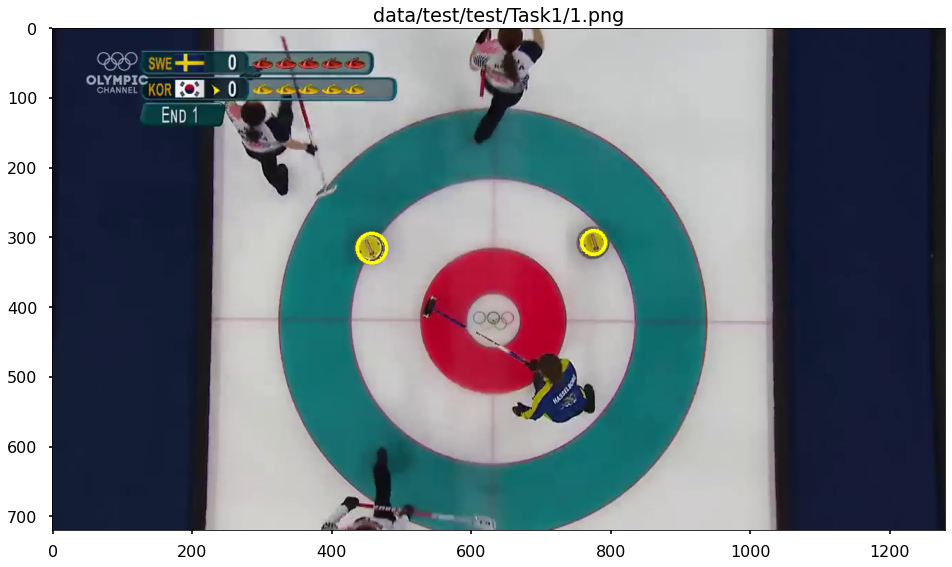

Current Image:  data/test/test/Task1/10.png
Number of red stones: 1
Number of yellow stones: 1


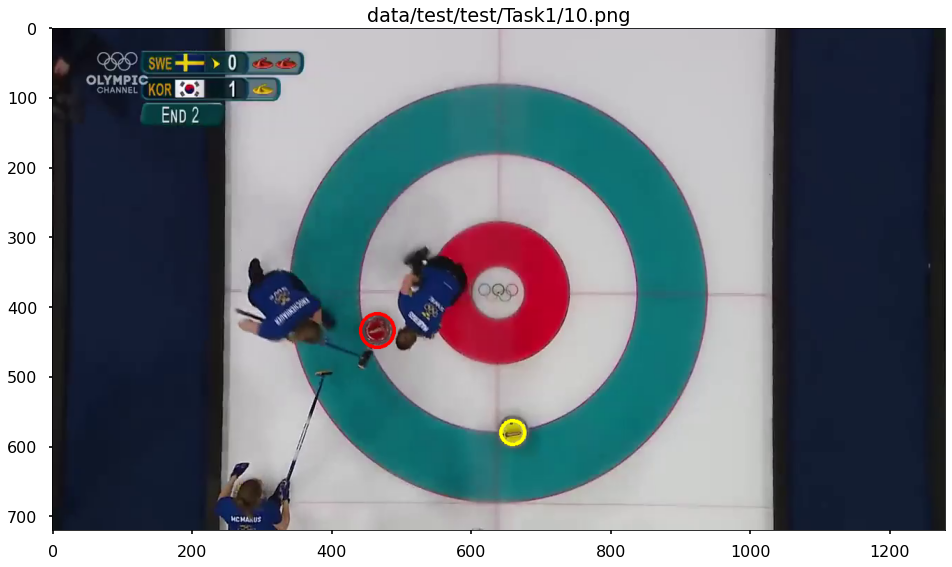

Current Image:  data/test/test/Task1/11.png
Number of red stones: 1
Number of yellow stones: 1


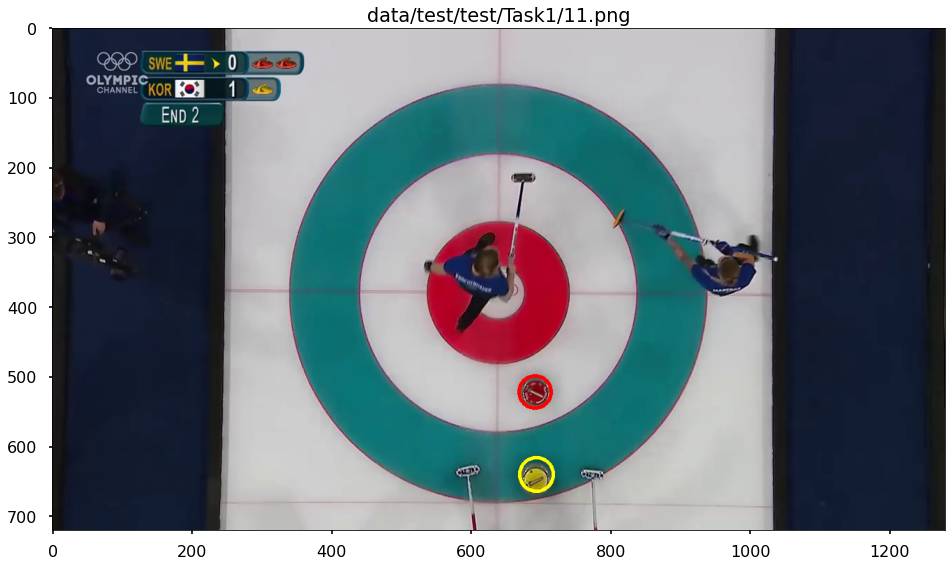

Current Image:  data/test/test/Task1/12.png
Number of red stones: 1
Number of yellow stones: 1


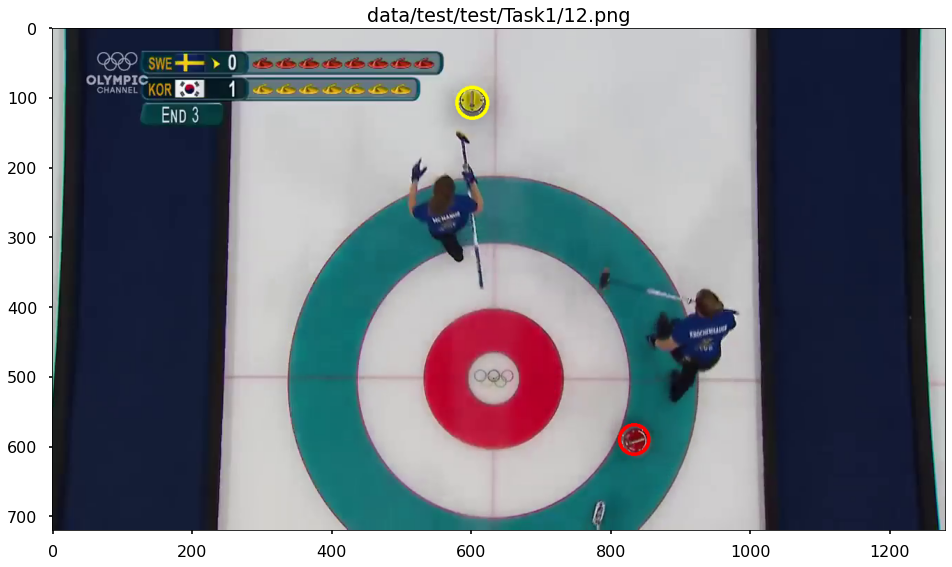

Current Image:  data/test/test/Task1/13.png
Number of red stones: 0
Number of yellow stones: 2


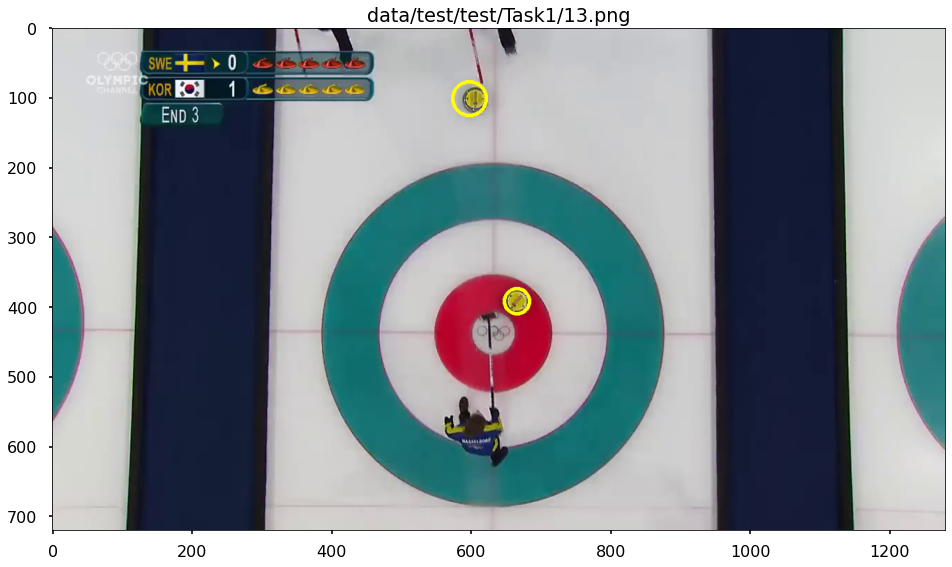

Current Image:  data/test/test/Task1/14.png
Number of red stones: 1
Number of yellow stones: 1


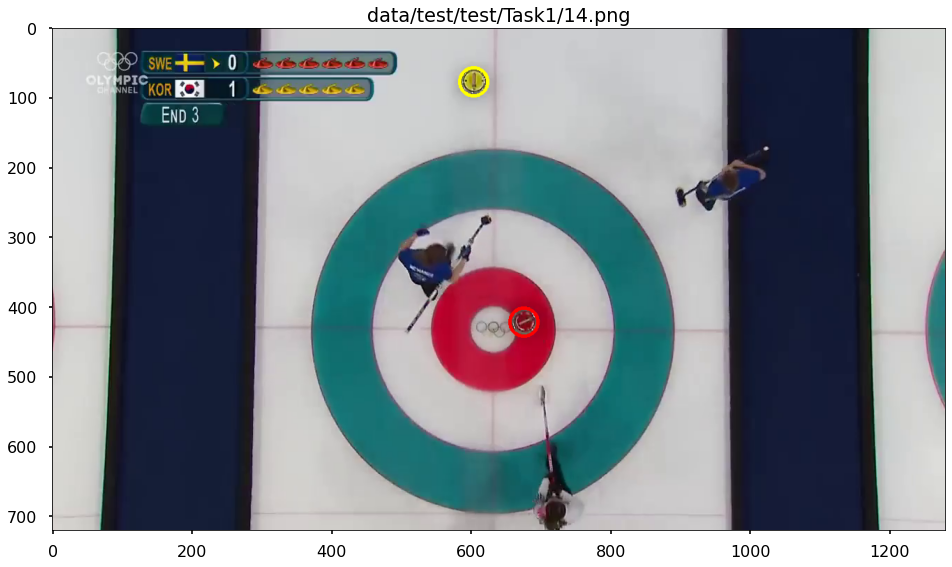

Current Image:  data/test/test/Task1/15.png
Number of red stones: 3
Number of yellow stones: 3


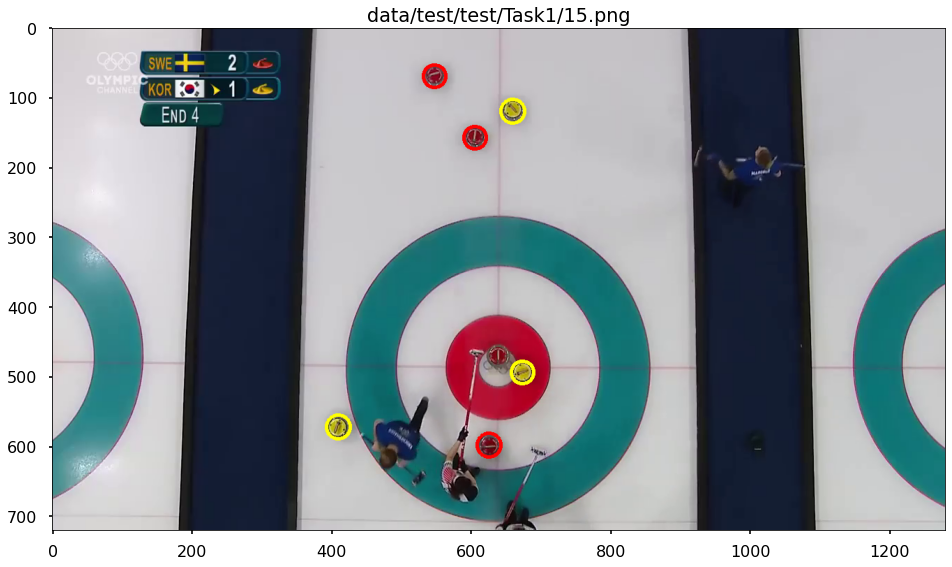

Current Image:  data/test/test/Task1/16.png
Number of red stones: 3
Number of yellow stones: 1


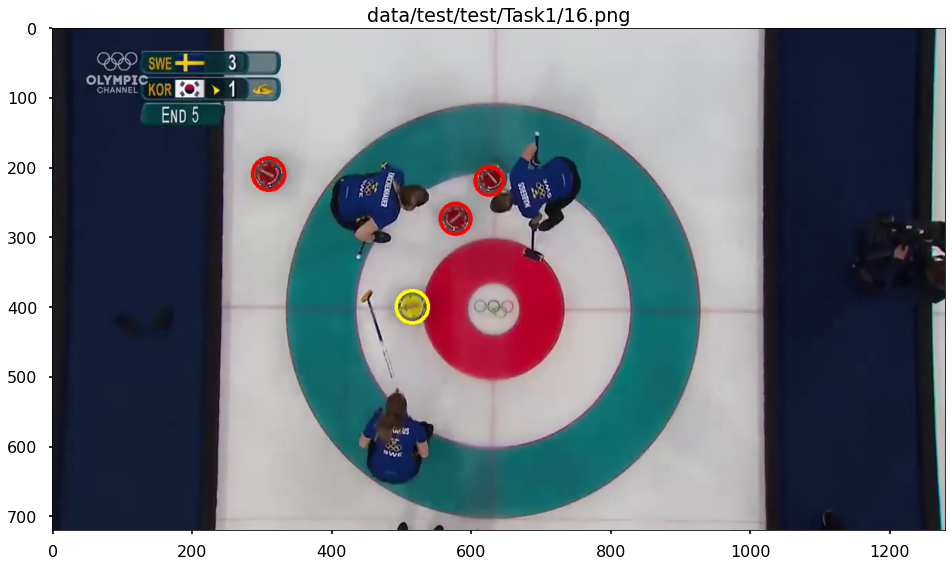

Current Image:  data/test/test/Task1/17.png
Number of red stones: 3
Number of yellow stones: 0


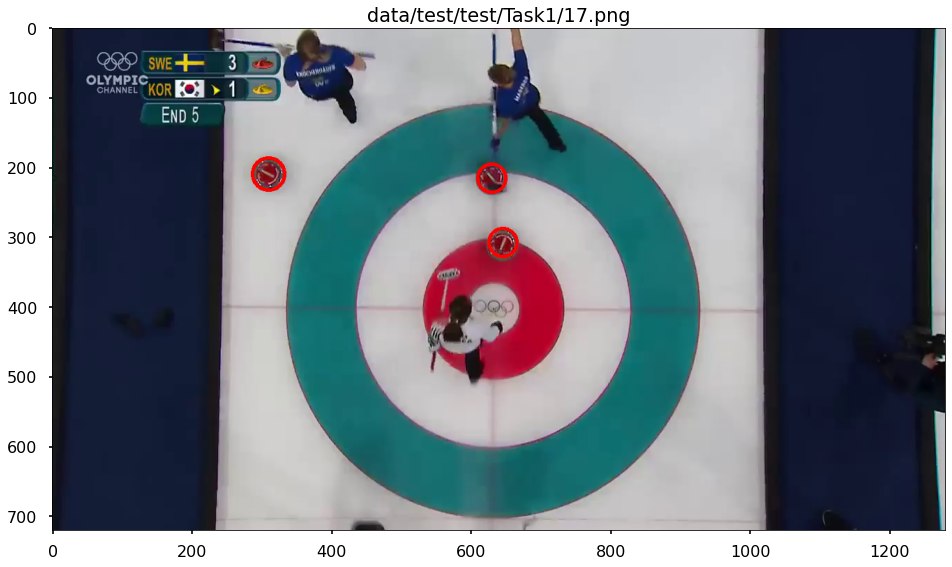

Current Image:  data/test/test/Task1/18.png
Number of red stones: 2
Number of yellow stones: 1


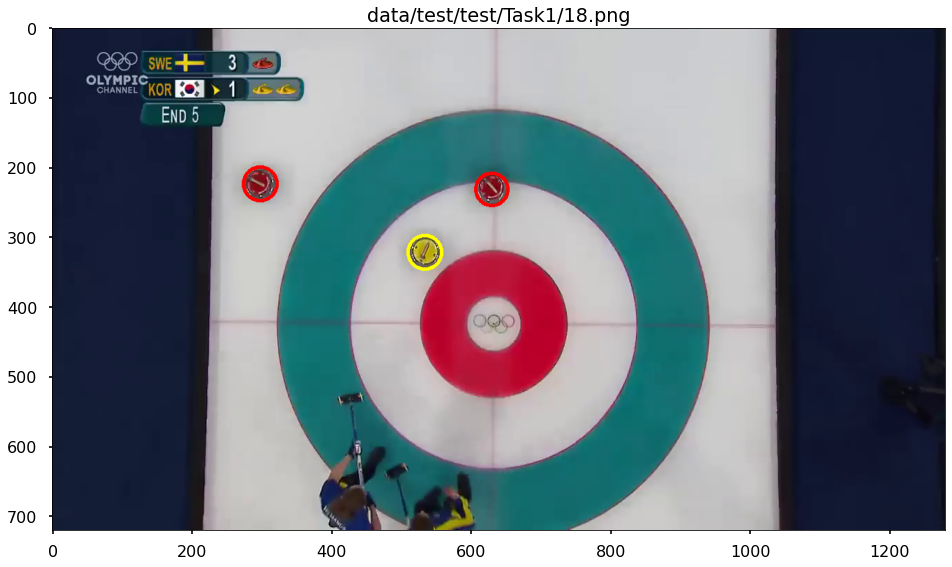

Current Image:  data/test/test/Task1/19.png
Number of red stones: 4
Number of yellow stones: 0


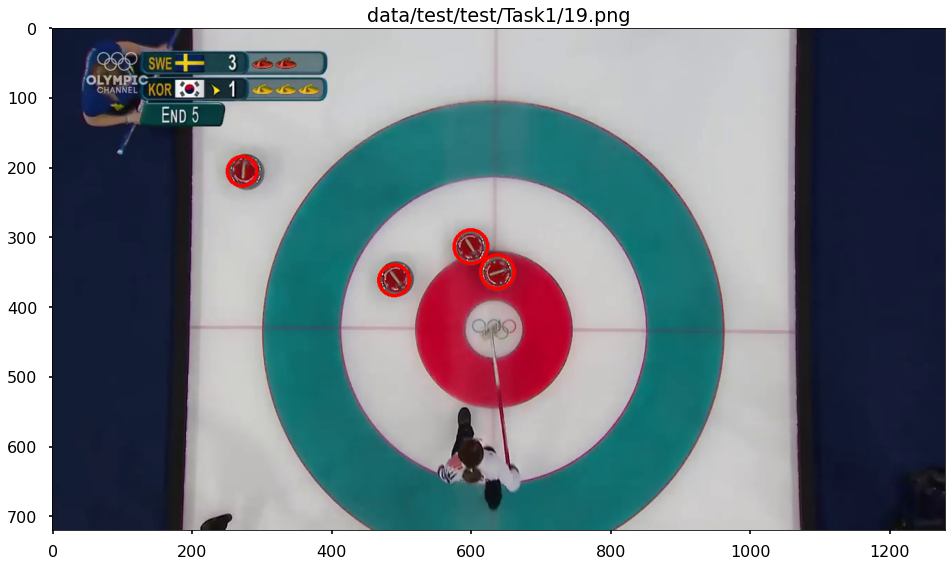

Current Image:  data/test/test/Task1/2.png
Number of red stones: 1
Number of yellow stones: 0


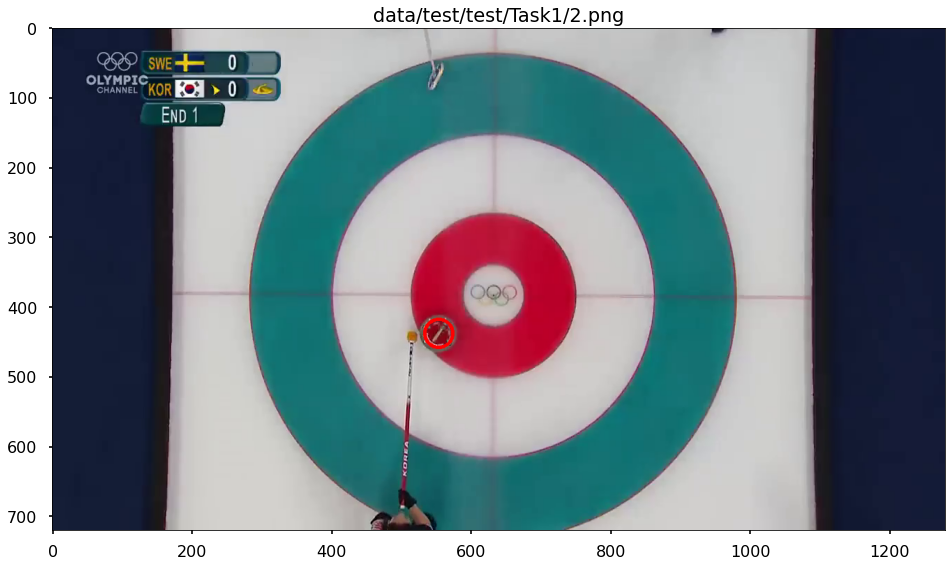

Current Image:  data/test/test/Task1/20.png
Number of red stones: 4
Number of yellow stones: 1


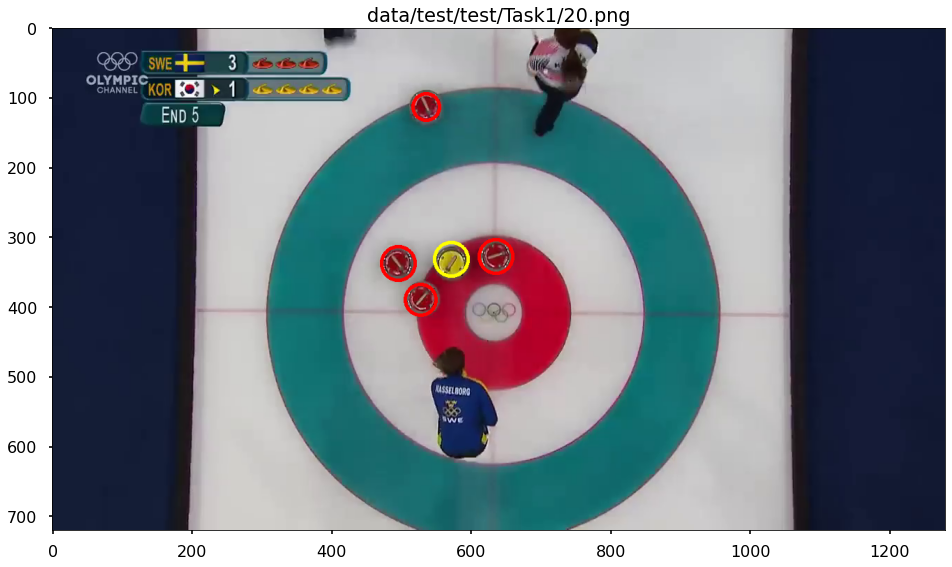

Current Image:  data/test/test/Task1/21.png
Number of red stones: 3
Number of yellow stones: 2


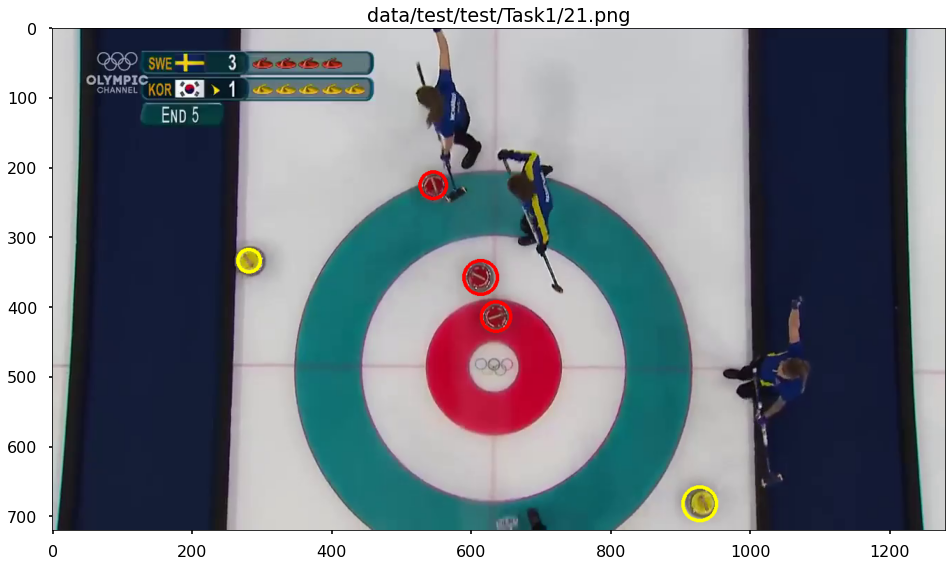

Current Image:  data/test/test/Task1/22.png
Number of red stones: 4
Number of yellow stones: 0


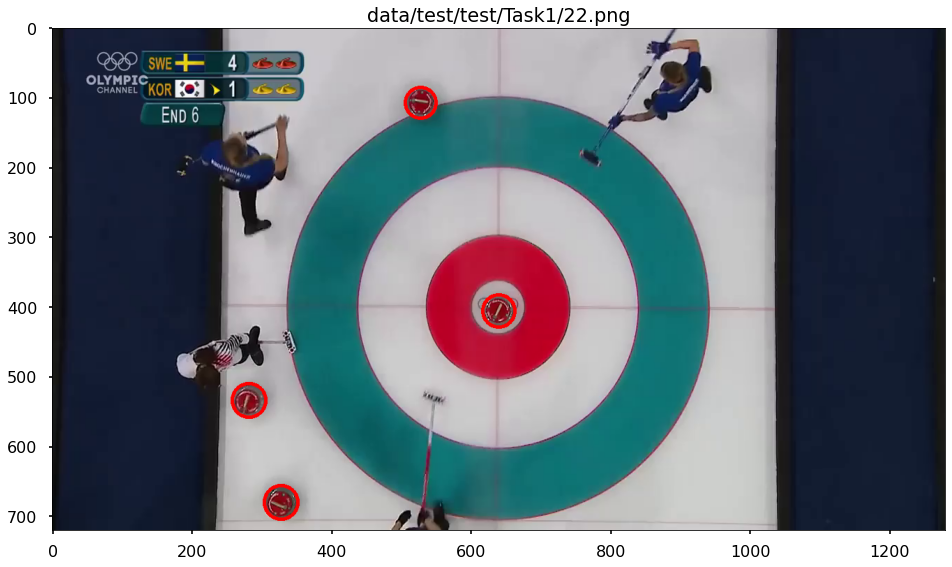

Current Image:  data/test/test/Task1/23.png
Number of red stones: 3
Number of yellow stones: 2


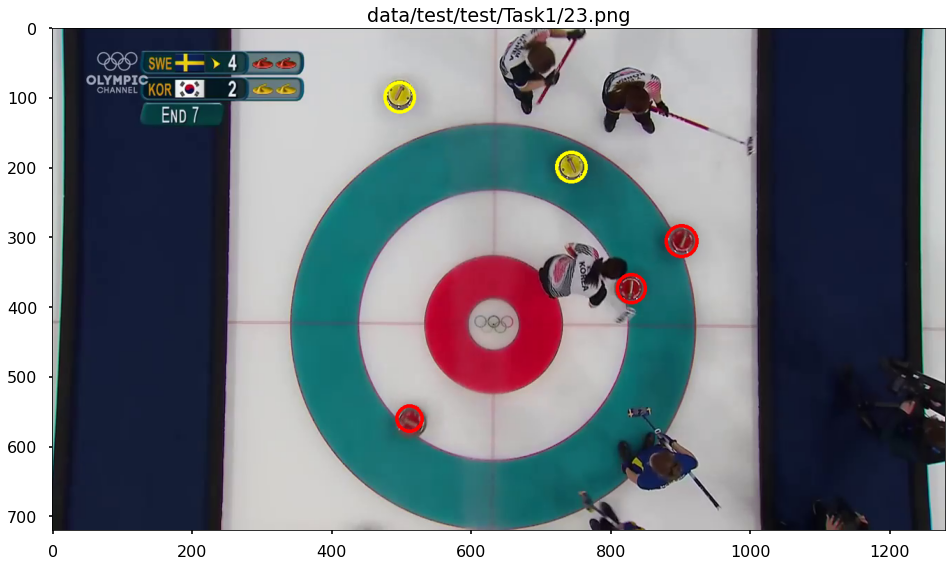

Current Image:  data/test/test/Task1/24.png
Number of red stones: 2
Number of yellow stones: 2


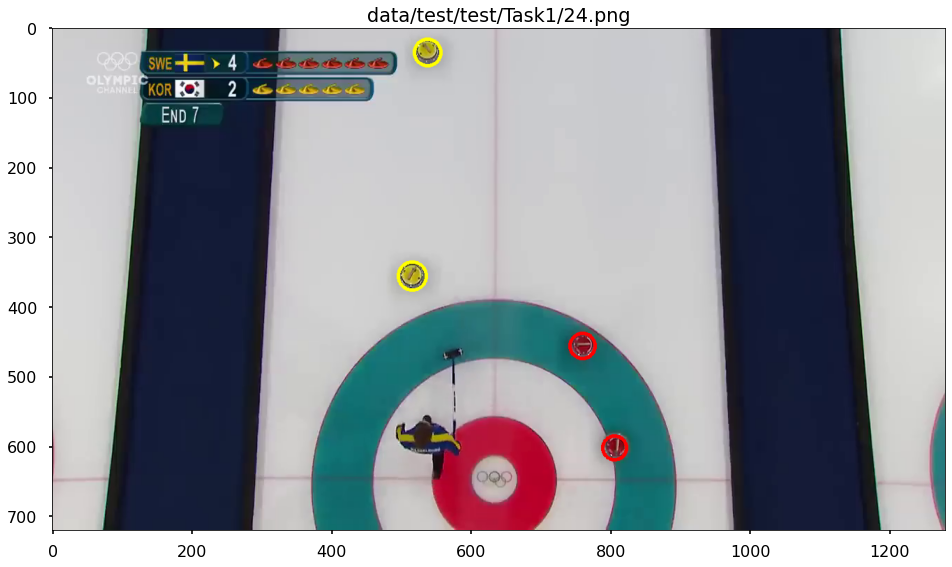

Current Image:  data/test/test/Task1/25.png
Number of red stones: 2
Number of yellow stones: 1


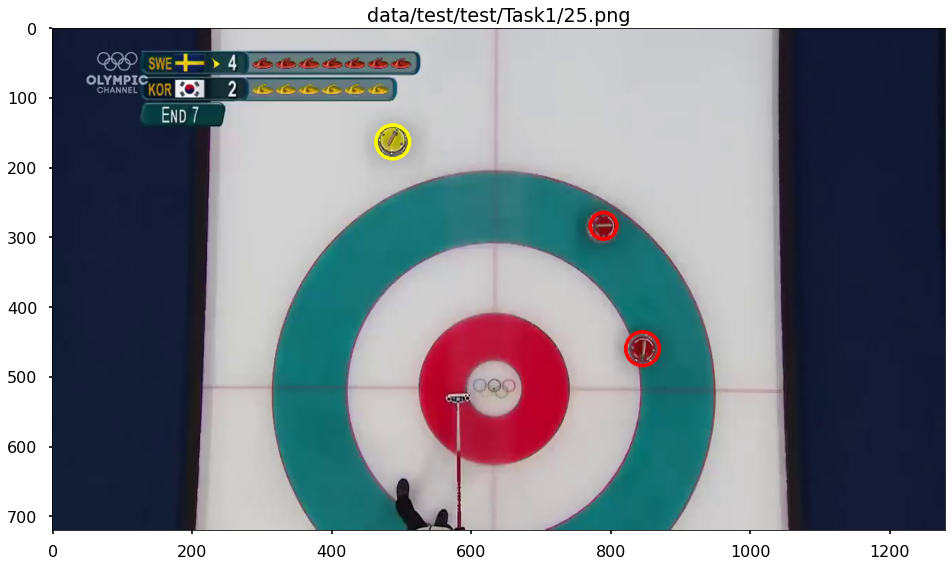

Current Image:  data/test/test/Task1/3.png
Number of red stones: 1
Number of yellow stones: 0


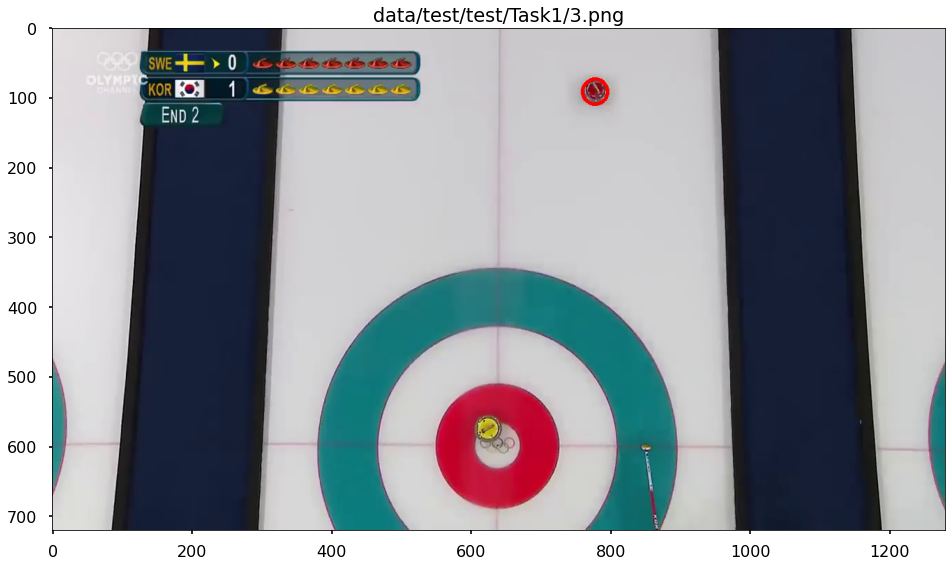

Current Image:  data/test/test/Task1/4.png
Number of red stones: 2
Number of yellow stones: 1


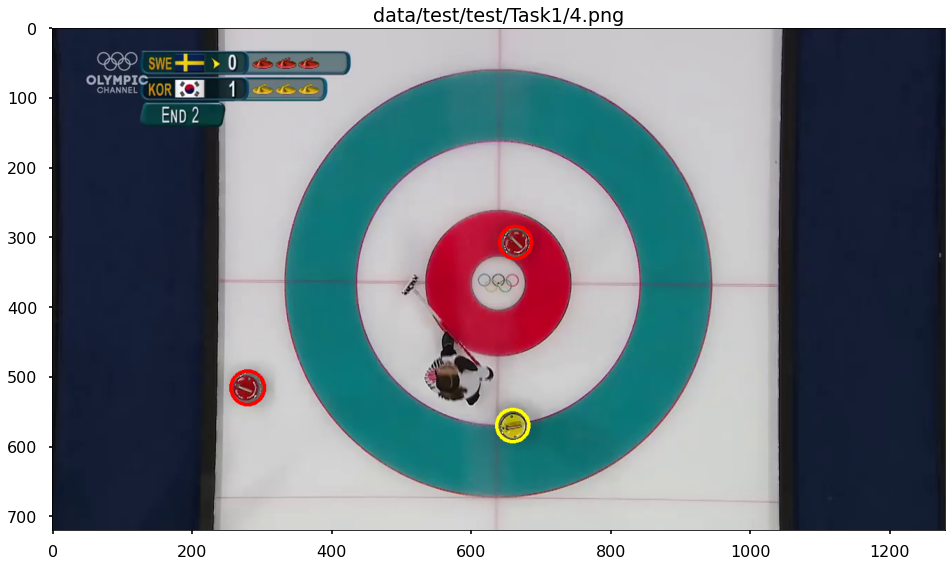

Current Image:  data/test/test/Task1/5.png
Number of red stones: 2
Number of yellow stones: 1


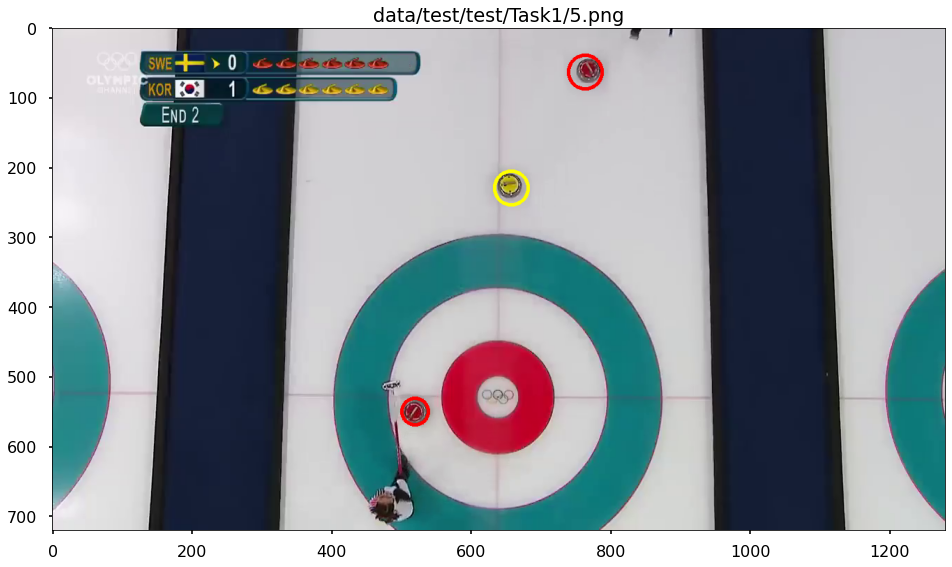

Current Image:  data/test/test/Task1/6.png
Number of red stones: 1
Number of yellow stones: 1


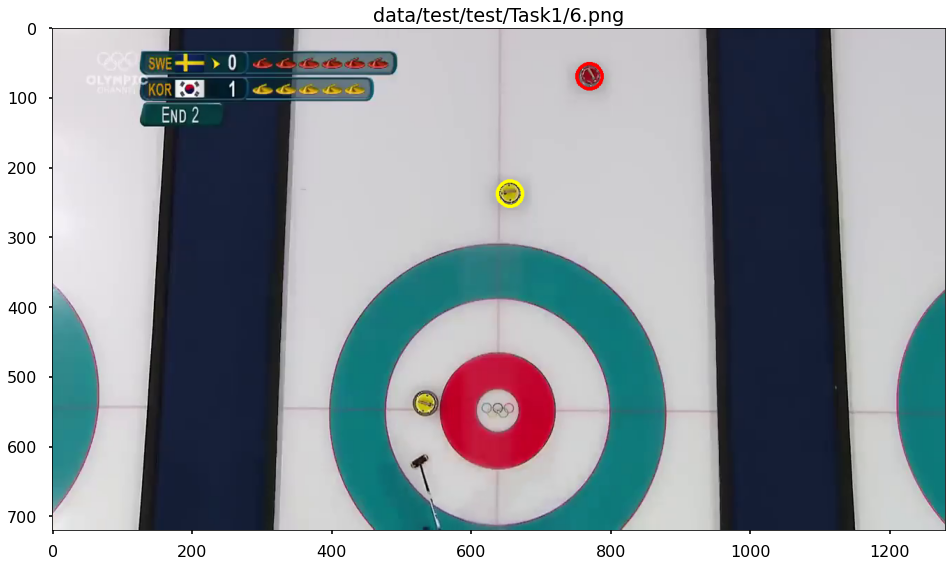

Current Image:  data/test/test/Task1/7.png
Number of red stones: 2
Number of yellow stones: 1


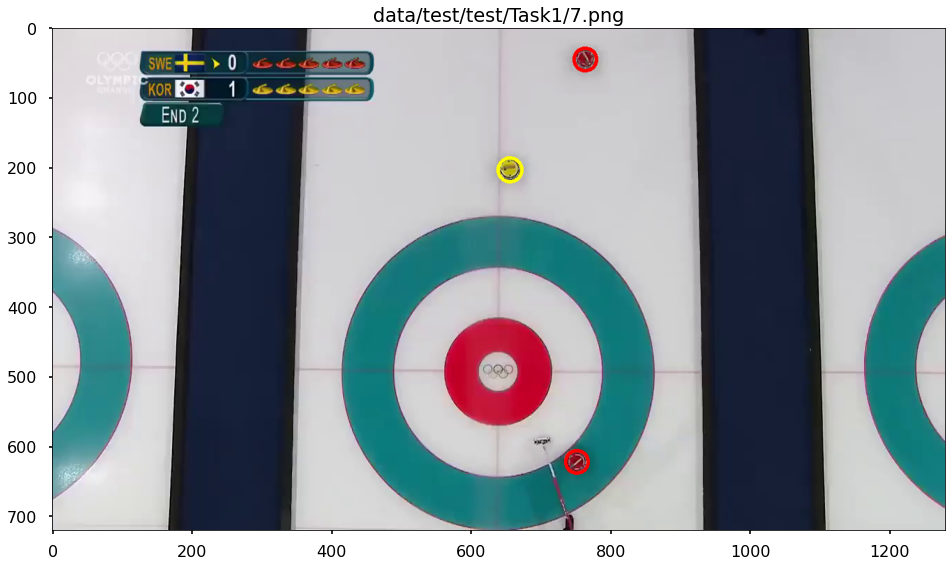

Current Image:  data/test/test/Task1/8.png
Number of red stones: 2
Number of yellow stones: 1


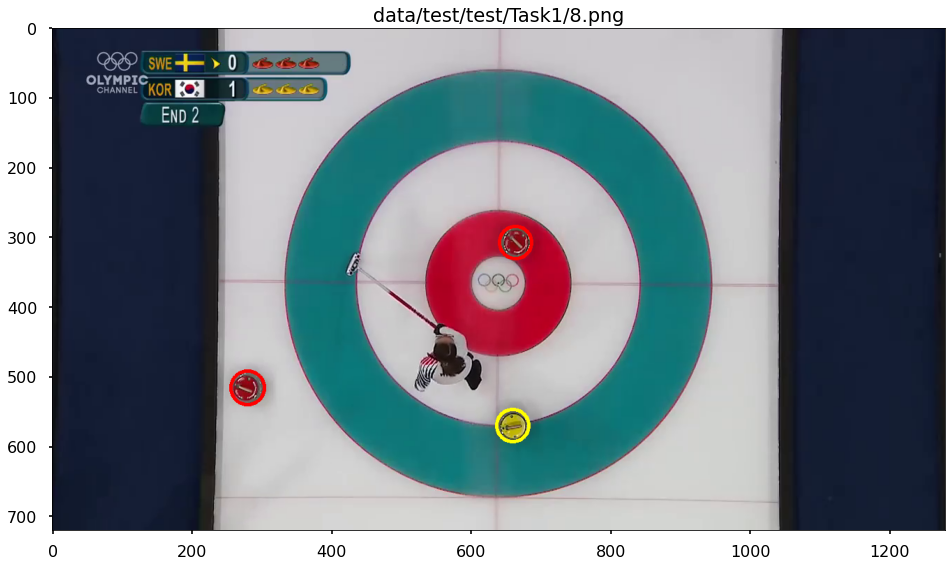

Current Image:  data/test/test/Task1/9.png
Number of red stones: 1
Number of yellow stones: 2


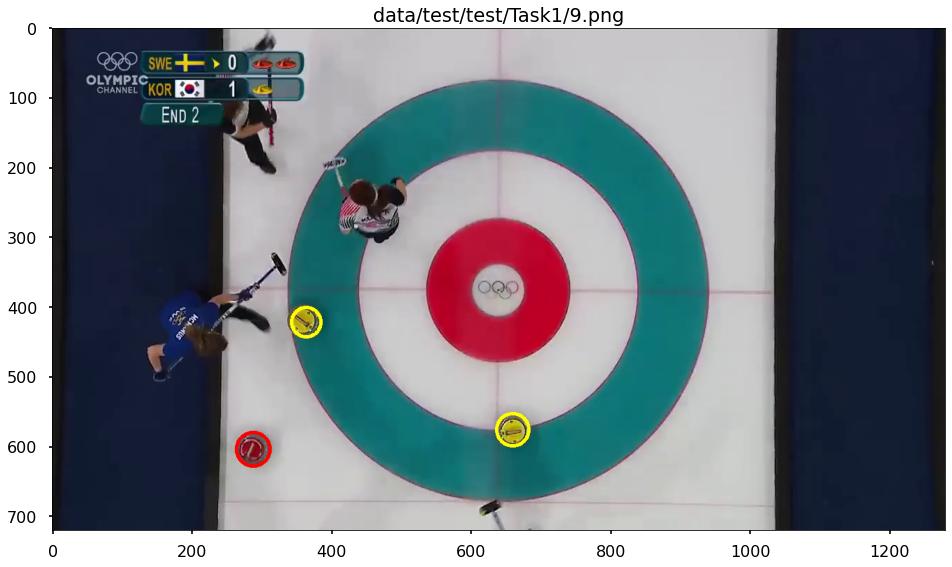

In [4]:
TASK = 1
PATH_TO_DATA = 'data/'
PATH_TO_IMAGES = 'data/test/test/Task{}/'.format(TASK)
PATH_TO_PREDICTIONS = 'data/test/predictions/Task{}/'.format(TASK)

run_task_one(PATH_TO_IMAGES, PATH_TO_PREDICTIONS, verbose = VERBOSE, evaluate = False)

# Task 2 - Computing the relative score based on videos 

### Problem Description

Task2 - this directory contains 15 training videos in the constrained scenario showing
the ice surface from above. The videos usually end when all stones have stopped from moving on the ice surface. 

### At this point we would like to know what is the potential score based on the configuration of stones on the ice. 

We will follow the curling scoring rules adapted to a single video. 

For our purpose we will consider that only one team (Red or Yellow) can score during a video. The Team Red plays with the red stones and the Team Yellow plays with the yellow stones. The team with the most stones in The House closest to the curling bullseye (the button) is awarded points. A stone which touches the edge of The House is considered to be inside The House, so it could potentially score a point. So if, after some stones are thrown, Team Red has a stone right on the button, and Team Yellow has a stone a few feet off the button, Team Red scores a point, so the score is 1-0. 

If Team Red has one stone on the button and a stone a few feet off the button, while Team Yellow has a stone on the outer edge of the house, Team Red scores two points, so the score is 2-0. If Team Red has three stones outside The House and Team Yellow has two stones inside The House, Team Yellow scores two points, so the score is 0-2. 

If no team has stones inside The House the score is 0-0. 

The format that you need to follow is the one used in the ground-truth files (located in the subdirectory ground-truth) with the first line containing the total number of points for Team Red and the second line containing the number of points for Team Yellow.

Please pay attention to the scoring rules as you will have to output similar scores in the test phase.

### Grading scheme for Task-2

In the test scenario we will release 15 testing videos similar with the training videos. By correctly solving the Task2 on all images you will get 1.5 points. You get 0.1 points/video if your algorithm correctly identifies the score (if the first and second line in your output file are correct).

### Proposed Solution

For each video that we have:
- We get the last frame of the video
- We apply a conversion from BGR to HSV
- We generate a blue mask that will be later used for detecting the House circle
- For smoothing the house circle we apply in this order
    1. 5 iterations of dilation with a kernel of 7x7
    2. median blur with a kernel of 51x51
    3. adaptive thresholding
    4. median blur with a kernel of 11x11
- On the generated image we apply Hough Circles for detecting the House circle
    1. If we detect only one circle we use it 
    2. If we detect multiple circles we use the blue mask for computing the mean intensity of the pixels for each detected circle, selecting the one 'with the most blue pixels'
- From the selected house circle we reduce the radius with a threshold (on the preprocessed image we used multiple iterations of dilation which can increase the size of the detected house and to match the original image house circle we need to reduce the radius)
- We use the approach from Task-1 to detect the red and yellow stones
- We find the stones inside the house (if exists) based on the distance between the house circle center and a detected circle center (should be smaller then the sum of the house radius with the detected circle radius)
- We sort the distances in ascending order
- We iterate through distance computing the score until we have stones with different colors
- Finally the score is computed

# Task-2 Implementation

In [5]:
def run_task_two(path_to_videos, path_to_predictions, verbose, evaluate):
    def evaluate_results_task2(predictions_path,ground_truth_path,verbose = 0):
        total_correct_scores = 0
        for i in range(1,16):
            filename_predictions = predictions_path + "/" + str(i) + "_predicted.txt"
            p = open(filename_predictions,"rt")        
            filename_ground_truth = ground_truth_path + "/" + str(i) + "_gt.txt"
            gt = open(filename_ground_truth,"rt")
            correct_scores = 1

            #read the first and second lines - giving the score
            p_line = p.readline()
            gt_line = gt.readline()
            if (p_line[:1] != gt_line[:1]):
                    correct_scores = 0
            p_line = p.readline()
            gt_line = gt.readline()
            if (p_line[:1] != gt_line[:1]):
                    correct_scores = 0                
            p.close()
            gt.close()

            if verbose:
                print("Task 2 -Assessing correct score: for test example number ", str(i), " the prediction is :", (1-correct_scores) * "in" + "correct" + "\n")

            total_correct_scores = total_correct_scores + + correct_scores        
            points = total_correct_scores * 0.1

        return total_correct_scores, points

    def extract_mean_pixels(image, x_center, y_center, radius):
        threshold = 0

        x_start = x_center - radius
        y_start = y_center - radius

        x_end = x_start + 2 * radius
        y_end = y_start + 2 * radius

        pixels = []
        for y in range(y_start + threshold, y_end - threshold):
            for x in range(x_start + threshold, x_end - threshold):
                if y >= 720 or x > 1280: continue
                if np.sqrt((x - x_center) ** 2 + (y - y_center) ** 2) < radius - 3:
                    pixels.append(image[y, x, :].mean())

        return np.mean(pixels)

    # Start of task-2
    for i, path_to_video in enumerate(sorted(glob.glob(path_to_videos + '*.mp4'))):
        if verbose: print(path_to_video)

        file_name = path_to_video.split(os.sep)[-1].split(".")[0]
        path_to_prediction_file = os.path.join(PATH_TO_PREDICTIONS, file_name + "_predicted.txt")
        prediction_file = open(path_to_prediction_file, 'w')

        vs = cv.VideoCapture(path_to_video)
        last_frame_num = vs.get(cv.CAP_PROP_FRAME_COUNT)
        vs.set(cv.CAP_PROP_POS_FRAMES, last_frame_num - 1)

        _, image = vs.read()

        output = image.copy()
        
        # Masking and preprocessing steps
        hsv = cv.cvtColor(image, cv.COLOR_BGR2HSV)

        lower_blue = np.array([70, 45, 60])
        upper_blue = np.array([110, 255, 135])

        mask = cv.inRange(hsv, lower_blue, upper_blue)
        blue = cv.bitwise_and(image, image, mask = mask)

        blue = cv.cvtColor(blue, cv.COLOR_HSV2BGR)
        gray = cv.cvtColor(blue, cv.COLOR_BGR2GRAY)

        black_pixels_mask     = np.all(blue == [0, 0, 0], axis=-1)
        non_black_pixels_mask = np.any(blue != [0, 0, 0], axis=-1)  

        gray[black_pixels_mask] = 0
        gray[non_black_pixels_mask] = 255

        kernel = np.ones((7, 7), np.uint8)
        gray   = cv.dilate(gray, kernel, iterations = 5)
        gray   = cv.medianBlur(gray, 51)

        gray = cv.adaptiveThreshold(gray, 255, cv.ADAPTIVE_THRESH_GAUSSIAN_C, cv.THRESH_BINARY, 31, 31)
        gray = cv.medianBlur(gray, 11)

        minDist   = 120 
        param1    = 80 
        param2    = 100
        minRadius = 150
        maxRadius = 380

        circles = cv.HoughCircles(gray, cv.HOUGH_GRADIENT, 2.0, minDist, param1 = param1, param2 = param2, minRadius = minRadius, maxRadius = maxRadius)

        # Detecting the house circle
        house = None
        dilation_threshold = 23
        if circles is not None:
            circles = np.round(circles[0, :]).astype("int")
            if len(circles) > 1:
                means = [extract_mean_pixels(blue, x, y, r) for (x, y, r) in circles]
                max_means = np.max(means)

                for (x, y, r) in circles:
                    mean = extract_mean_pixels(blue, x, y, r)
                    if mean == max_means:
                        image = cv.circle(image, (x, y), r - dilation_threshold, (0, 255, 0), 3)
                        house = (x, y, r - dilation_threshold)

            else:
                for (x, y, r) in circles:
                    image = cv.circle(image, (x, y), r - dilation_threshold, (0, 255, 0), 3)
                    house = (x, y, r - dilation_threshold)
    
        # Detecting the stones
        gray = cv.cvtColor(output, cv.COLOR_BGR2GRAY)
        gray = cv.medianBlur(gray, 3)

        minDist   = 35
        param1    = 20
        param2    = 17
        minRadius = 15
        maxRadius = 25

        circles = cv.HoughCircles(gray, cv.HOUGH_GRADIENT, 1, minDist, param1 = param1, param2 = param2, minRadius = minRadius, maxRadius = maxRadius)

        stones = []
        if circles is not None:
            circles = np.round(circles[0, :]).astype("int")
            for (x, y, r) in circles:
                is_valid, is_red, is_yellow = extract_red_and_yellow(output, x, y, r)

                if is_valid:
                    if is_red: 
                        image = cv.circle(image, (x,y), r, (0, 0, 255), 3)
                        stones.append((x, y, r, 'red'))
                    else:
                        image = cv.circle(image, (x,y), r, (0, 255, 255), 3)
                        stones.append((x, y, r, 'yellow'))

        # Generating the distances
        distances = {}
        for stone in stones:
            distance = np.sqrt((stone[0] - house[0]) ** 2 + (stone[1] - house[1]) ** 2)
            if distance < stone[2] + house[2]:
                distances[np.round(distance, 3)] = stone[3]

        score = {
            'red': 0,
            'yellow': 0,
        }

        # Computing the score
        if len(distances) != 0:
            last = distances[sorted(distances.keys())[0]]
            for key in sorted(distances.keys()):
                if distances[key] == last:
                    last = distances[key]
                    score[distances[key]] += 1
                else:
                    break

        prediction_file.write('{}\n{}'.format(score['red'], score['yellow']))
        prediction_file.close()
        
        if verbose:
            print("Score: {} red - {} yellow".format(score['red'], score['yellow']))
            plt.figure(figsize = (16, 26))
            plt.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB))
            plt.title(path_to_video)
            plt.show()
            
    
    if evaluate:
        path_to_ground_truth = os.path.join(path_to_videos, 'ground-truth')
        print("Correct Scores {}, Points: {}".format(
            *evaluate_results_task2(path_to_predictions, path_to_ground_truth, verbose = verbose)))


# Run Task-2

Use the function 'run_task_two' with the following parameters
- path_to_images = relative or absolute path to stored images
- path_to_predictions = relative or absolute path to the folder where the predictions will be saved
- verbose = used for showing scores and displaying images
- evaluate = assuming a 'ground-truth' folder inside the path_to_images folder, computes the metrics and task points

data/test/test/Task2/1.mp4
Score: 0 red - 2 yellow


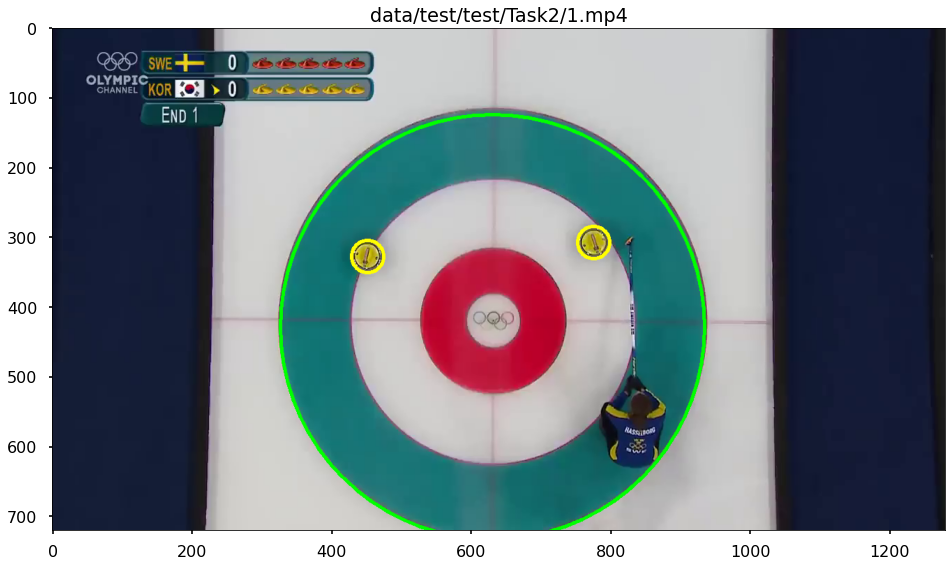

data/test/test/Task2/10.mp4
Score: 0 red - 1 yellow


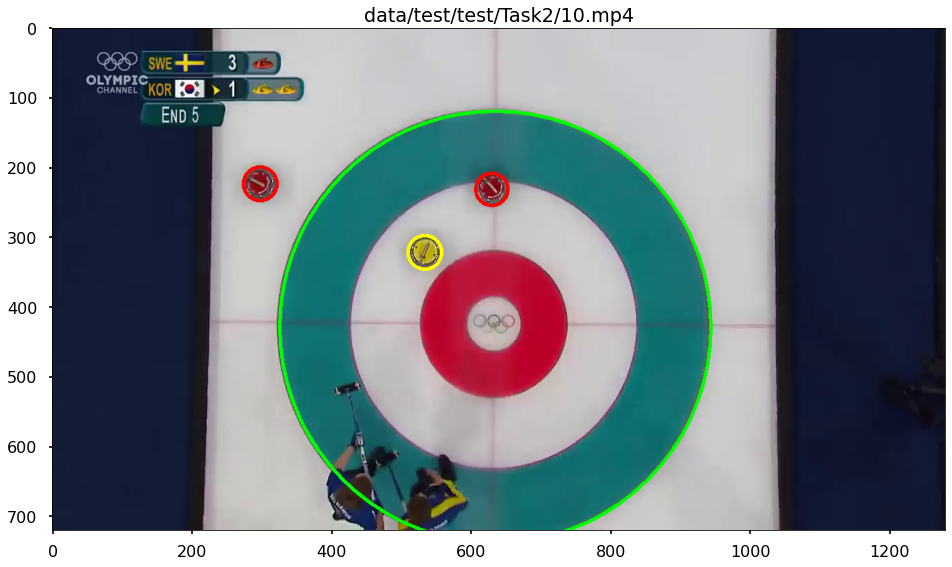

data/test/test/Task2/11.mp4
Score: 1 red - 0 yellow


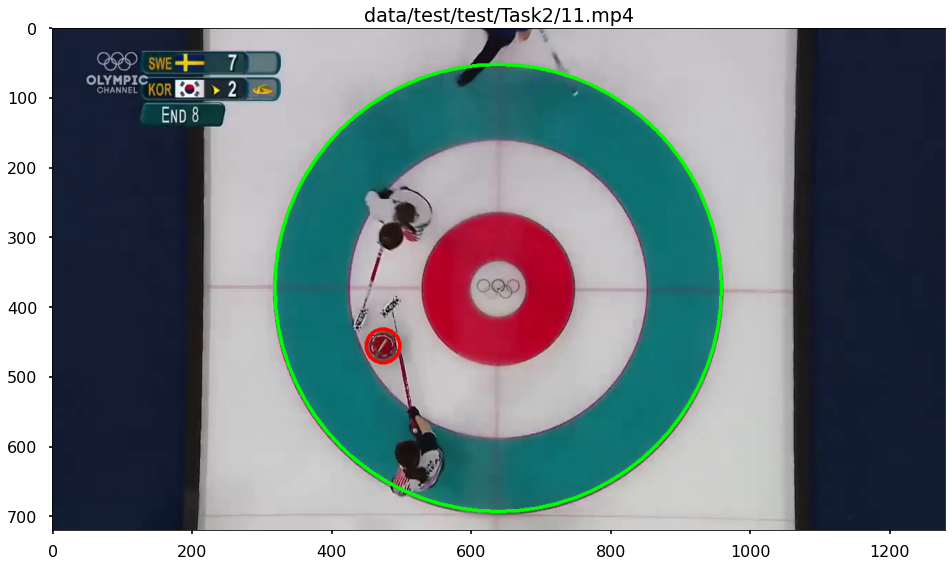

data/test/test/Task2/12.mp4
Score: 1 red - 0 yellow


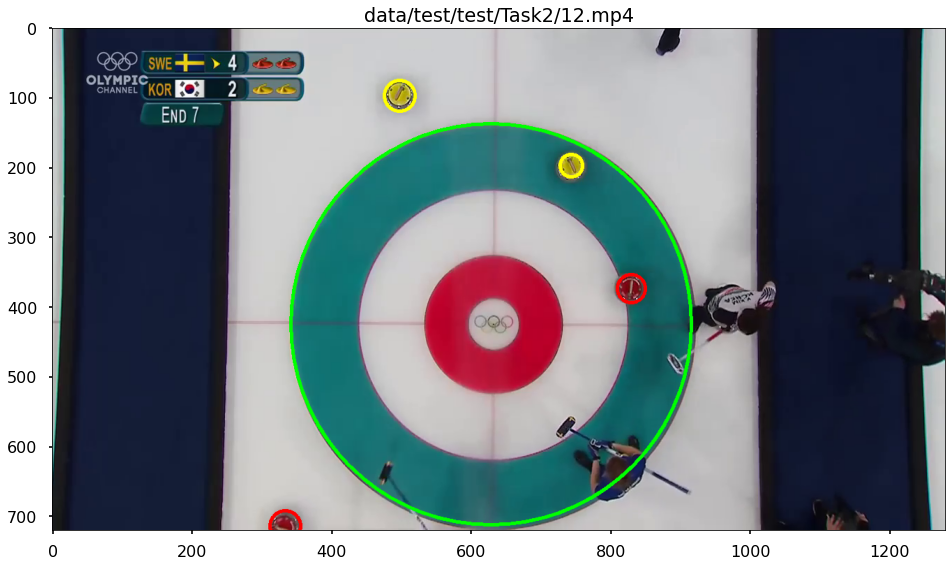

data/test/test/Task2/13.mp4
Score: 2 red - 0 yellow


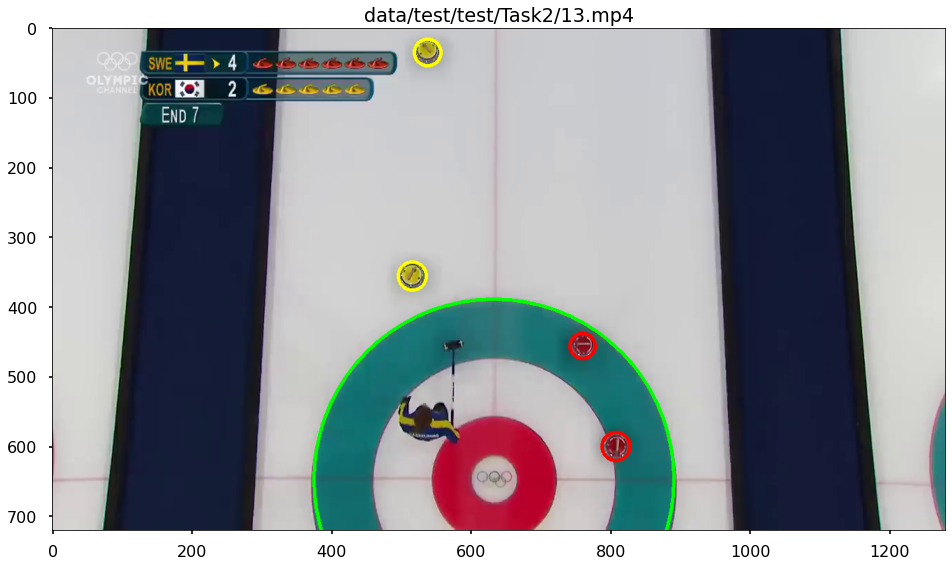

data/test/test/Task2/14.mp4
Score: 0 red - 1 yellow


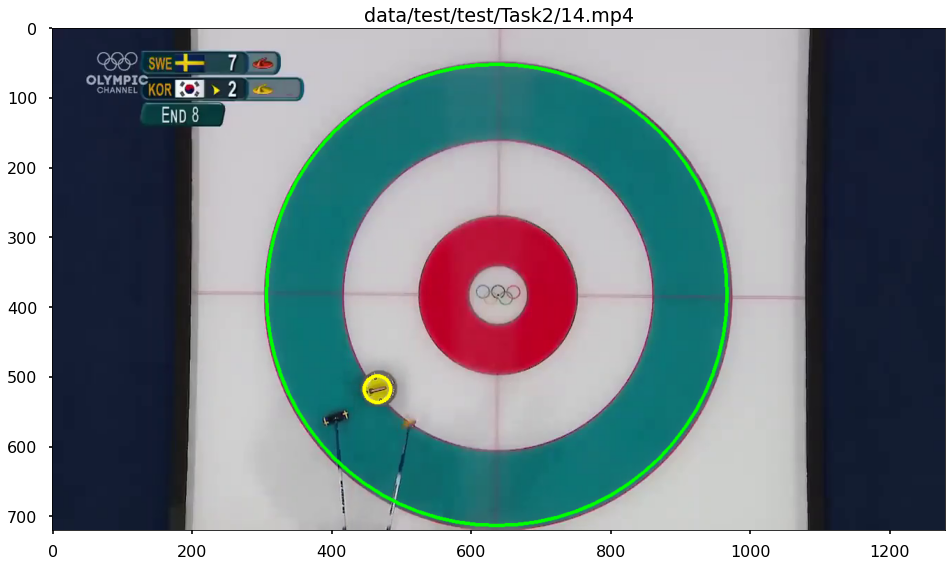

data/test/test/Task2/15.mp4
Score: 2 red - 0 yellow


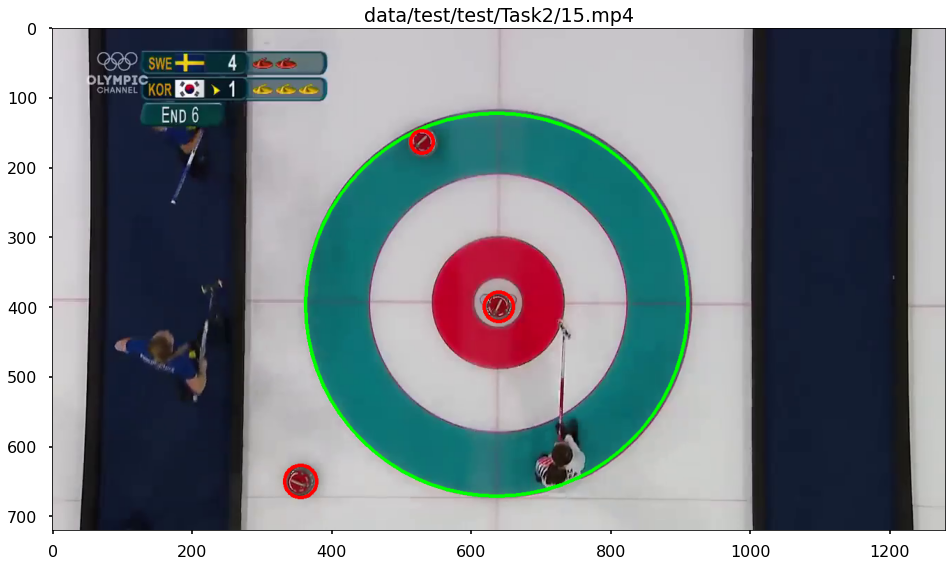

data/test/test/Task2/2.mp4
Score: 1 red - 0 yellow


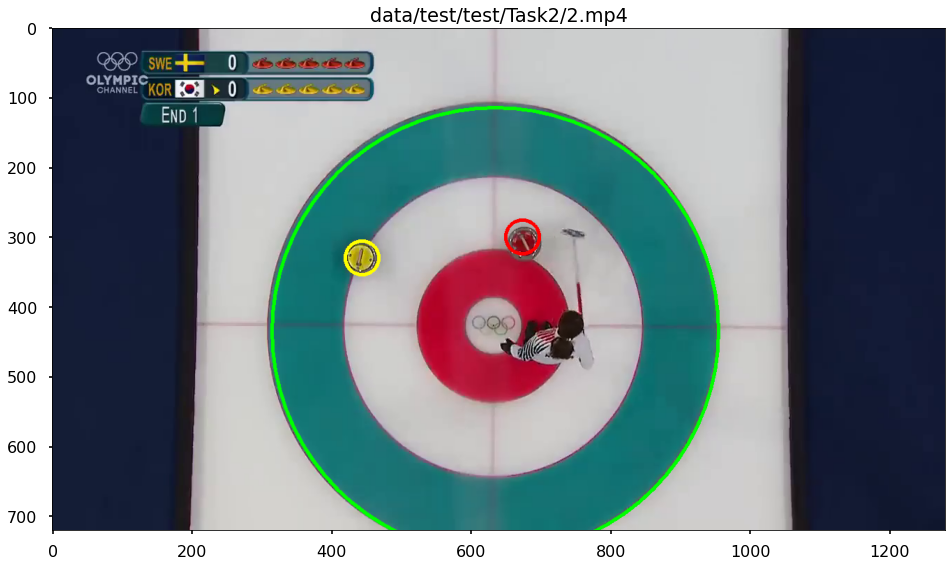

data/test/test/Task2/3.mp4
Score: 1 red - 0 yellow


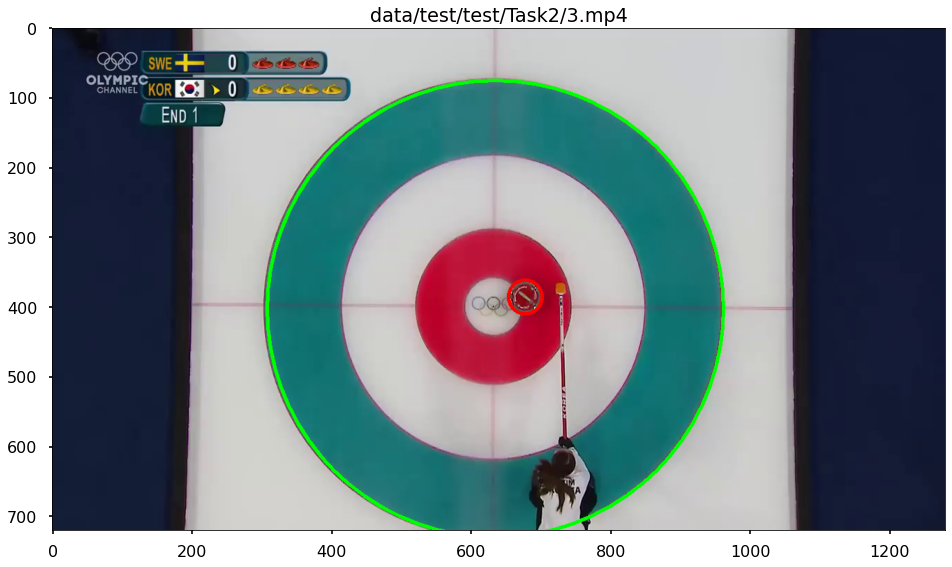

data/test/test/Task2/4.mp4
Score: 0 red - 0 yellow


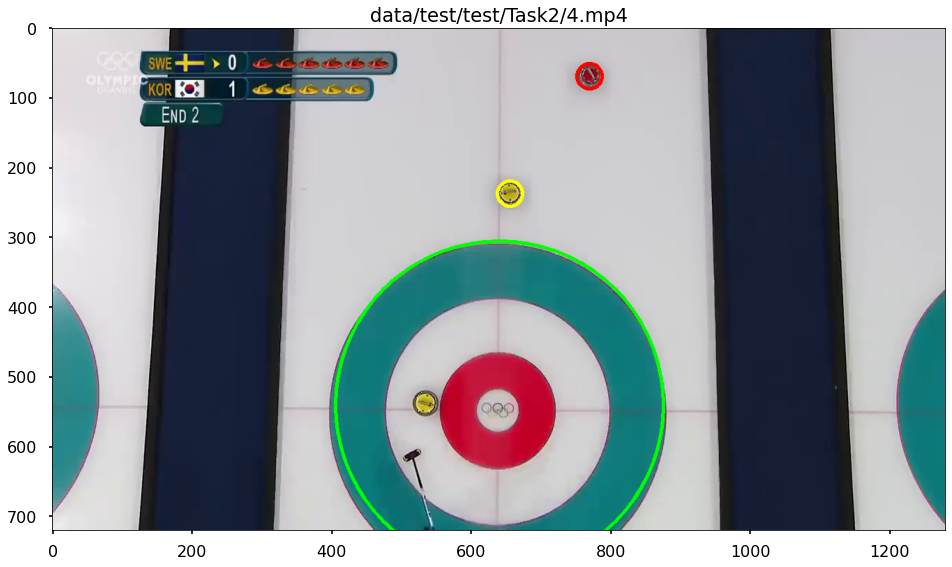

data/test/test/Task2/5.mp4
Score: 1 red - 0 yellow


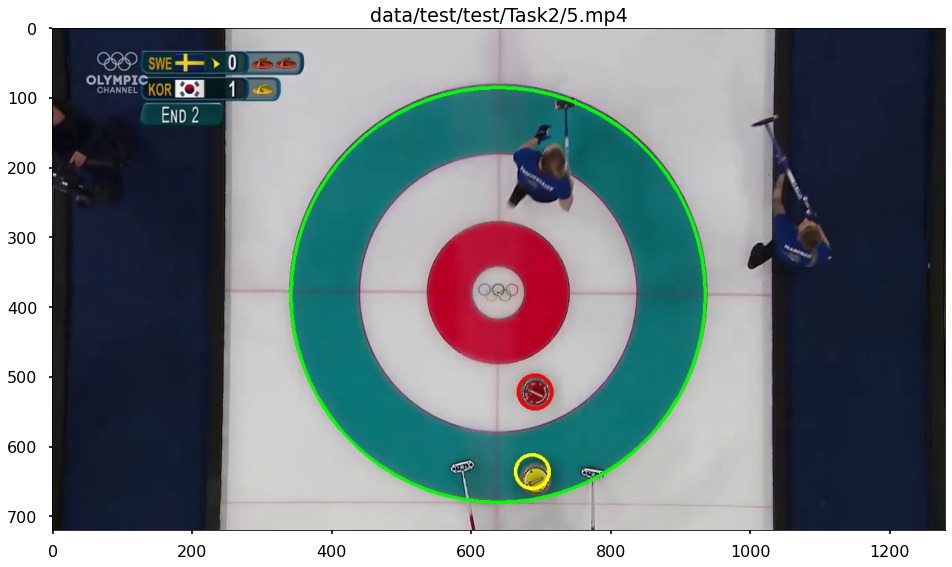

data/test/test/Task2/6.mp4
Score: 0 red - 1 yellow


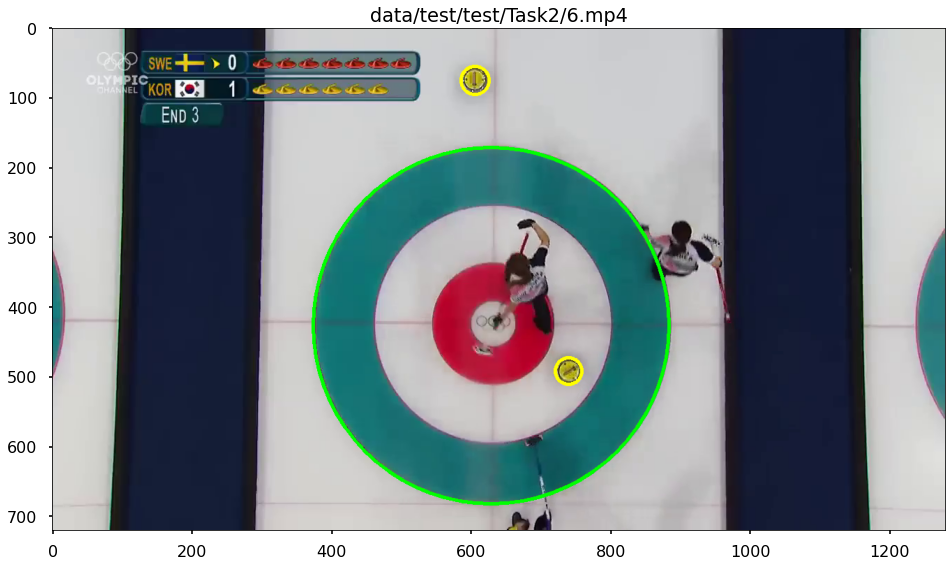

data/test/test/Task2/7.mp4
Score: 0 red - 0 yellow


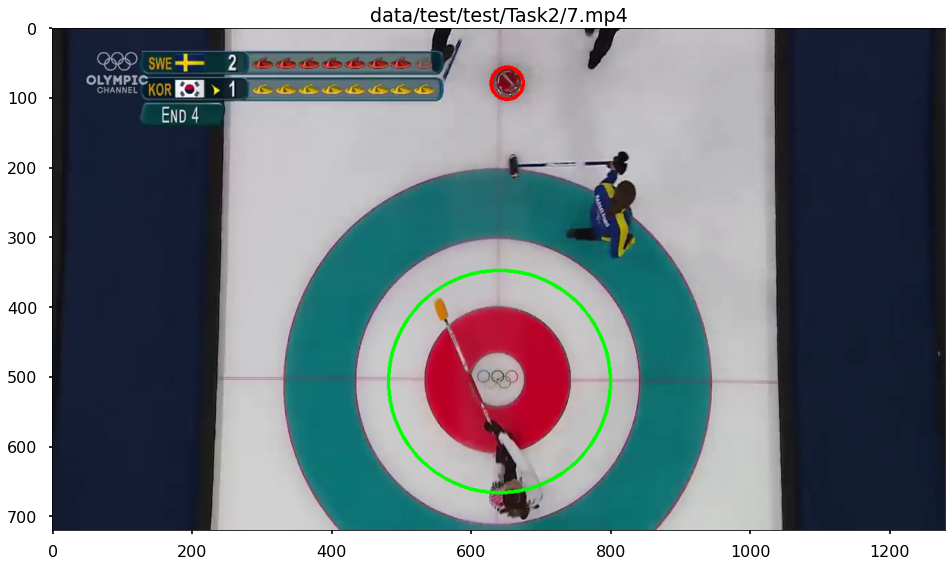

data/test/test/Task2/8.mp4
Score: 0 red - 1 yellow


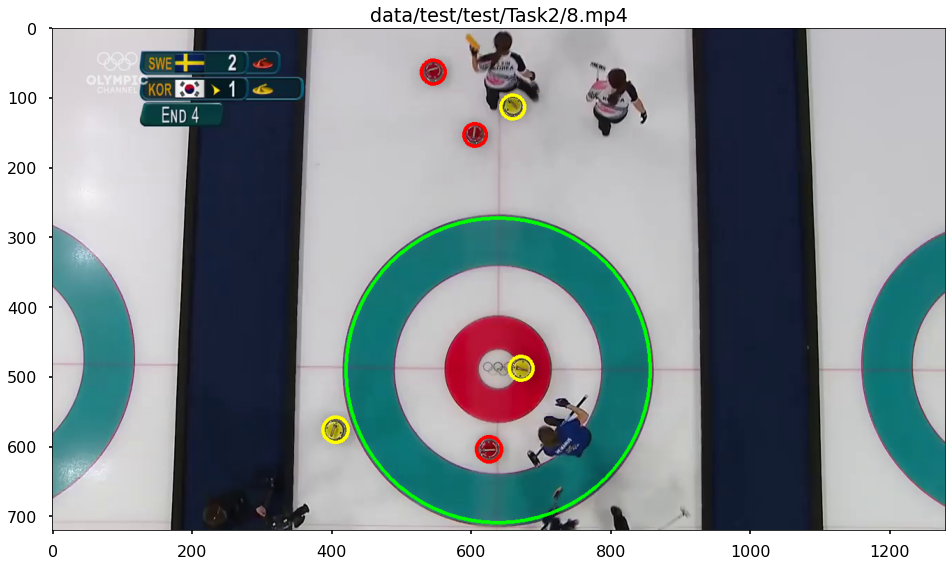

data/test/test/Task2/9.mp4
Score: 1 red - 0 yellow


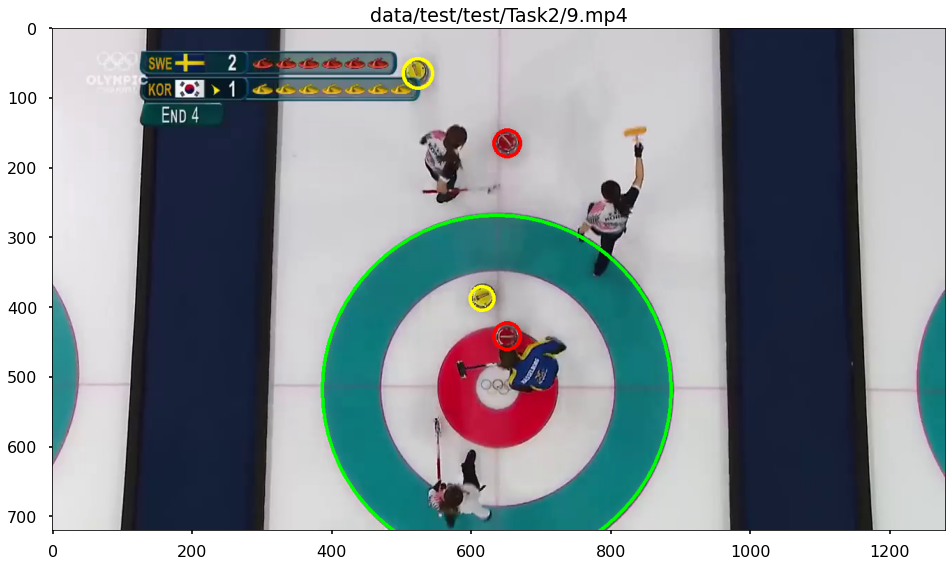

In [6]:
TASK = 2
PATH_TO_DATA = 'data/'
PATH_TO_VIDEOS = 'data/test/test/Task{}/'.format(TASK)
PATH_TO_PREDICTIONS   = 'data/test/predictions/Task{}/'.format(TASK)

run_task_two(PATH_TO_VIDEOS, PATH_TO_PREDICTIONS, verbose = VERBOSE, evaluate = False)

# Task 3 - Tracking Stones in a constrained scenario

### Problem Description

Task3 - this directory contains 15 training videos in the constrained scenario showing
the ice surface from above. The task is to track the stone thrown by a player. 
You should track the stone from the initial frame to the final frame of the video. The stone is either red or yellow. 

The initial bounding box of the stone to be tracked is provided for the first frame (the annotation follows the format [xmin ymin xmax ymax], where (xmin,ymin) is the top left corner and (xmax,ymax) is the bottom right corner of the initial bounding-box). 

In each video we will consider that your algorithm correctly tracks the stone if in more (greater or equal) than 80% of the video frames your algorithm correctly localizes the stone to be tracked. 

We consider that your algorithmcorrectly localizes the stone to be tracked in a specific frame if the value of the IOU (intersection over union) beetween the window provided by your algorithm and the ground-truth window is more than 20%. The format that you need to follow is the one used in the ground-truth files (located in the subdirectory ground-truth) with the first line containing the number of frames N of the video, and each line having the format [frame index xmin ymin xmax ymax]. 

The first frame for which we provide the bounding box initialization has frame index 0, the last frame of a video with N frames has frame index N − 1. Please note that the first line of the annotation file has the format [N -1 -1 -1 -1] as it is easy to load the entire matrix ( N + 1 ) × 5 to assess the correctness of your algorithm. Notice that for this task the stone to be tracked appears in each frame of the video.

### Grading scheme for Task-3

In the test scenario we will release 15 testing videos similar with the training videos. By correctly solving the Task3 on all images you will get 1.5 points. You get 0.1 points/video if your algorithm correctly tracks the stone in a video.

### Proposed Solution
For each frame in each video that we have:
- We apply a conversion from BGR to HSV
- We generate a red, yellow and gray mask
- We apply the combined mask over the original image
- We use CSRT tracker to detect the initial bounding box in the masked frames

# Task-3 Implementation

In [7]:
def run_task_three(path_to_videos, path_to_predictions, verbose = 0, evaluate = False):
    def bb_intersection_over_union(boxA, boxB):
        # determine the (x, y)-coordinates of the intersection rectangle
        xA = max(boxA[0], boxB[0])
        yA = max(boxA[1], boxB[1])
        xB = min(boxA[2], boxB[2])
        yB = min(boxA[3], boxB[3])
        # compute the area of intersection rectangle
        interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
        # compute the area of both the prediction and ground-truth
        # rectangles
        boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
        boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
        # compute the intersection over union by taking the intersection
        # area and dividing it by the sum of prediction + ground-truth
        # areas - the intersection area
        iou = interArea / float(boxAArea + boxBArea - interArea)
        # return the intersection over union value
        return iou

    def compute_percentage_tracking(gt_bboxes, predicted_bboxes, num_frames):
        """
        This function compute the percentage of detected bounding boxes based on the ground-truth bboxes and the predicted ones.
        :param gt_bboxes. The ground-truth bboxes with the format: frame_idx, x_min, y_min, x_max, y_max.
        :param predicted_bboxes. The predicted bboxes with the format: frame_idx, x_min, y_min, x_max, y_max
        :param num_frames. The total number of frames in the video.
        """

        num_frames = int(num_frames)

        tp = 0
        fp = 0
        tn = 0
        fn = 0

        gt_dict = {}
        for gt_box in gt_bboxes:
            gt_dict[gt_box[0]] = gt_box[1:]

        pred_dict = {}
        for pred_bbox in predicted_bboxes:
            pred_dict[pred_bbox[0]] = pred_bbox[1:]

        for i in range(num_frames):
            if gt_dict.get(i, None) is None and pred_dict.get(i, None) is None: # the stone is not on the ice surface
                tn += 1 

            elif gt_dict.get(i, None) is not None and pred_dict.get(i, None) is None: # the stone is not detected
                fn += 1

            elif gt_dict.get(i, None) is None and pred_dict.get(i, None) is not None: # the stone is not on the ice surface, but it is 'detected'
                fp += 1

            elif gt_dict.get(i, None) is not None and pred_dict.get(i, None) is not None: # the stone is on the ice surface and it is detected

                iou = bb_intersection_over_union(gt_dict[i], pred_dict[i])
                if iou >= 0.2:
                    tp += 1
                else:
                    fp += 1 

        print(f'tp = {tp}, tn = {tn}, fp = {fp},fn = {fn}')
        assert tn + fn + tp + fp == num_frames
        perc = (tp + tn) / (tp + fp + tn + fn)

        return perc

    def evaluate_results_task3(predictions_path,ground_truth_path, verbose = 0):
        total_correct_tracked_videos = 0
        for i in range(1,16):
            filename_predictions = predictions_path + "/" + str(i) + "_predicted.txt"        
            filename_ground_truth = ground_truth_path + "/" + str(i) + "_gt.txt"

            p = np.loadtxt(filename_predictions)
            num_frames = p[0][0]
            predicted_bboxes = p[1:]

            gt = np.loadtxt(filename_ground_truth)
            gt_bboxes = gt[1:]

            percentage = compute_percentage_tracking(gt_bboxes, predicted_bboxes, num_frames)

            correct_tracked_videos = 1
            if percentage < 0.8:
                 correct_tracked_videos = 0

            print("percentage = ", percentage)
            if verbose:
                print("Task 3 - Tracking a stone in constrained scenario: for test example number ", str(i), " the prediction is :", (1-correct_tracked_videos) * "in" + "correct", "\n")

            total_correct_tracked_videos = total_correct_tracked_videos + correct_tracked_videos

        points = total_correct_tracked_videos * 0.1

        return total_correct_tracked_videos,points 


    tracker = cv.TrackerCSRT_create()


    for i, path_to_video in enumerate(sorted(glob.glob(path_to_videos + '*.mp4'))):
        if verbose: print(path_to_video)
    
        file_name = path_to_video.split(os.sep)[-1].split(".")[0]
        path_to_prediction_file = os.path.join(path_to_predictions, file_name + "_predicted.txt")
        prediction_file = open(path_to_prediction_file, 'w')

        box_file_path = path_to_video.split('/')[-1].split('.')[0]
        box_file = open(os.path.join(path_to_videos, box_file_path + '.txt'), 'r')

        lines = box_file.readlines()
        frames = int(lines[0].split(' ')[0])
        initial_frame = int(lines[1].split(' ')[0])

        xmin = int(lines[1].split(' ')[1])
        ymin = int(lines[1].split(' ')[2])
        xmax = int(lines[1].split(' ')[3])
        ymax = int(lines[1].split(' ')[4])

        first_line = "{} -1 -1 -1 -1\n".format(frames)
        prediction_file.write(first_line)

        vs = cv.VideoCapture(path_to_video)
        vs.set(cv.CAP_PROP_POS_FRAMES, initial_frame)
        _, frame = vs.read()
        frame_copy = frame.copy()

        hsv = cv.cvtColor(frame, cv.COLOR_BGR2HSV)

        red_lower = np.array([175, 70, 70])
        red_upper = np.array([255, 255, 160])

        yellow_lower = np.array([20, 100, 135])
        yellow_upper = np.array([50, 255, 190])

        lower_gray = np.array([0, 5, 60])
        upper_gray = np.array([165, 130, 140])

        red_mask    = cv.inRange(hsv, red_lower, red_upper)
        yellow_mask = cv.inRange(hsv, yellow_lower, yellow_upper)
        gray_mask   = cv.inRange(hsv, lower_gray, upper_gray)

        mask = yellow_mask + red_mask + gray_mask

        frame  = cv.bitwise_and(frame, frame, mask = mask)

        if verbose: 
            original = cv.rectangle(frame_copy.copy(), (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
            plt.figure(figsize = (16, 26))
            plt.imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
            plt.title("Original Frame (Video Path: {})".format(path_to_video))
            plt.show()
            
            masked = cv.rectangle(frame.copy(), (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)
            plt.figure(figsize = (16, 26))
            plt.imshow(cv.cvtColor(masked, cv.COLOR_BGR2RGB))
            plt.title("Actaul Frame used for Tracking (Video Path: {})".format(path_to_video))
            plt.show()

        threshold = 0
        box = (xmin + threshold, ymin + threshold, xmax - xmin - threshold, ymax - ymin - threshold)

        ok = tracker.init(frame, box)
        
        counter = 0
        line = '{} {} {} {} {}\n'.format(counter, xmin, ymin, xmax, ymax)
        prediction_file.write(line)
        counter += 1

        while True:
            ok, frame = vs.read()
            
            if not ok:
                break
            
            frame_copy = frame.copy()
            hsv  = cv.cvtColor(frame, cv.COLOR_BGR2HSV)

            red_mask    = cv.inRange(hsv, red_lower, red_upper)
            yellow_mask = cv.inRange(hsv, yellow_lower, yellow_upper)
            gray_mask   = cv.inRange(hsv, lower_gray, upper_gray)

            mask = yellow_mask + red_mask + gray_mask

            frame  = cv.bitwise_and(frame, frame, mask = mask)

            ok, bbox = tracker.update(frame)

            p1 = (int(bbox[0]), int(bbox[1]))
            p2 = (int(bbox[0] + bbox[2]), int(bbox[1] + bbox[3]))
            cv.rectangle(frame_copy, p1, p2, (0, 255,0), 2, 1)

            if counter < frames:
                line = '{} {} {} {} {}\n'.format(counter, p1[0], p1[1], p2[0], p2[1])
            else:
                line = '{} {} {} {} {}'.format(counter, p1[0], p1[1], p2[0], p2[1])

            prediction_file.write(line)
            counter += 1

#             cv.imshow("Tracking", copy)
#             # Exit if ESC pressed
#             k = cv.waitKey(1) & 0xff
#             if k == 27 : break

        prediction_file.close()
    
    if evaluate:
        path_to_ground_truth = os.path.join(path_to_videos, 'ground-truth')
        print("Correct Videos: {}, Points: {}".format(
            *evaluate_results_task3(path_to_predictions, path_to_ground_truth, verbose)
        ))


# Run Task-3

Use the function 'run_task_three' with the following parameters
- path_to_images = relative or absolute path to stored images
- path_to_predictions = relative or absolute path to the folder where the predictions will be saved
- verbose = used for displaying images
- evaluate = assuming a 'ground-truth' folder inside the path_to_images folder, computes the metrics and task points

data/test/test/Task3/1.mp4


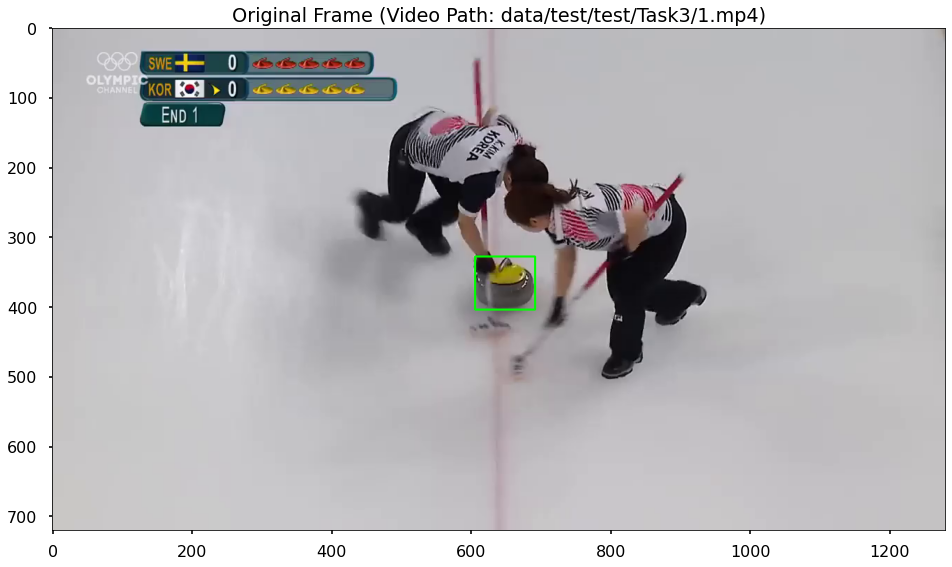

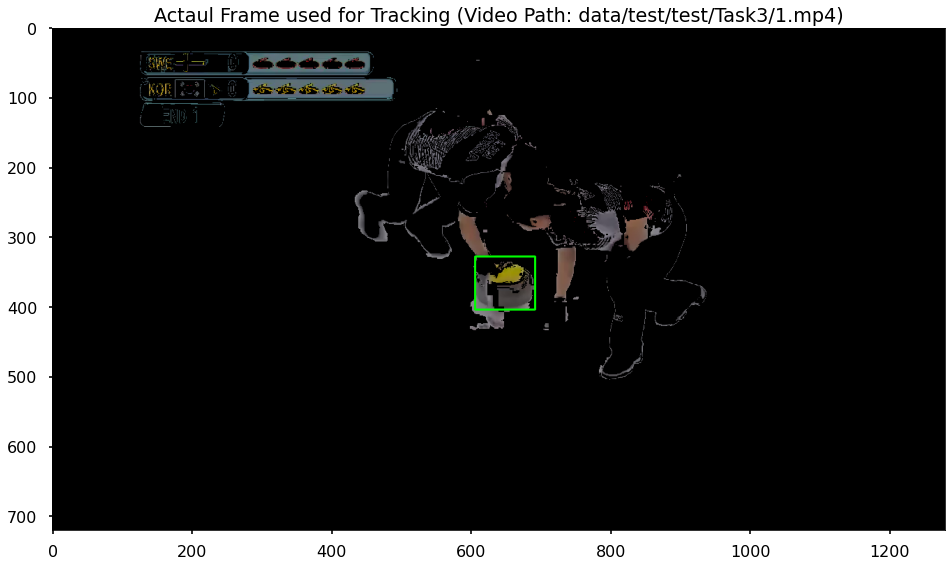

data/test/test/Task3/10.mp4


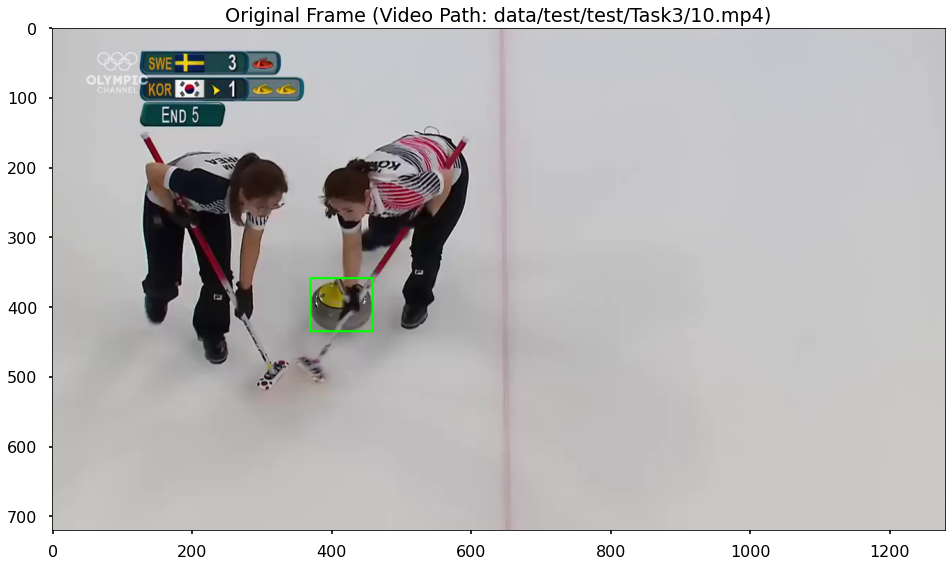

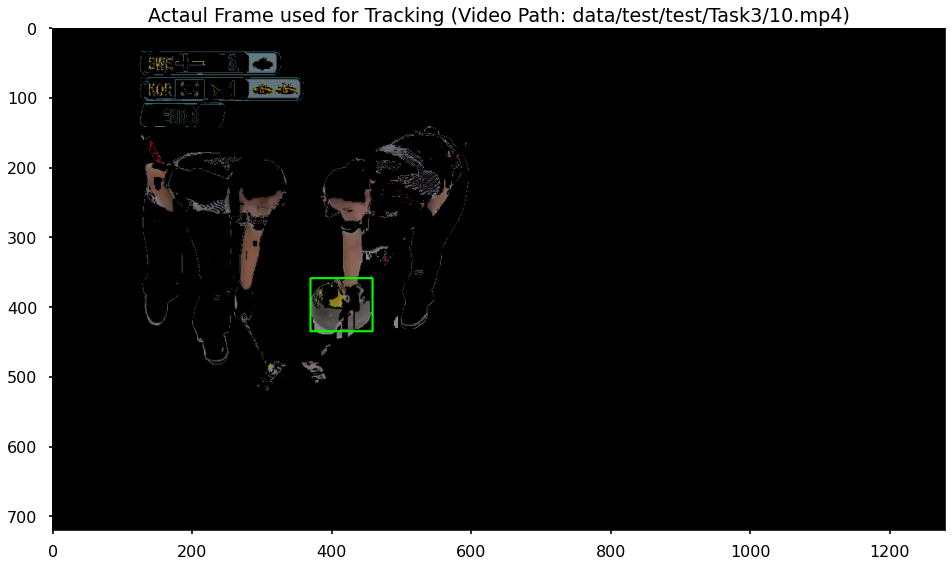

data/test/test/Task3/11.mp4


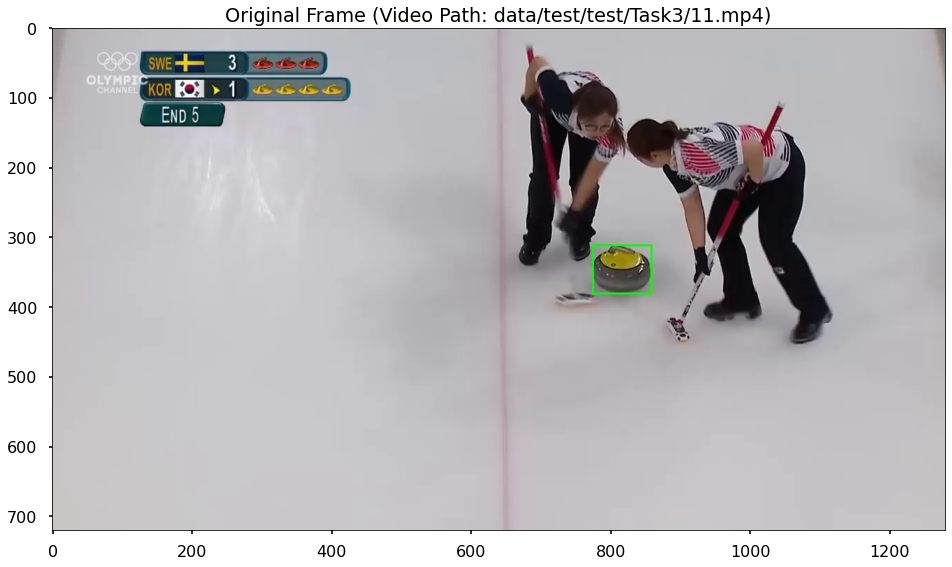

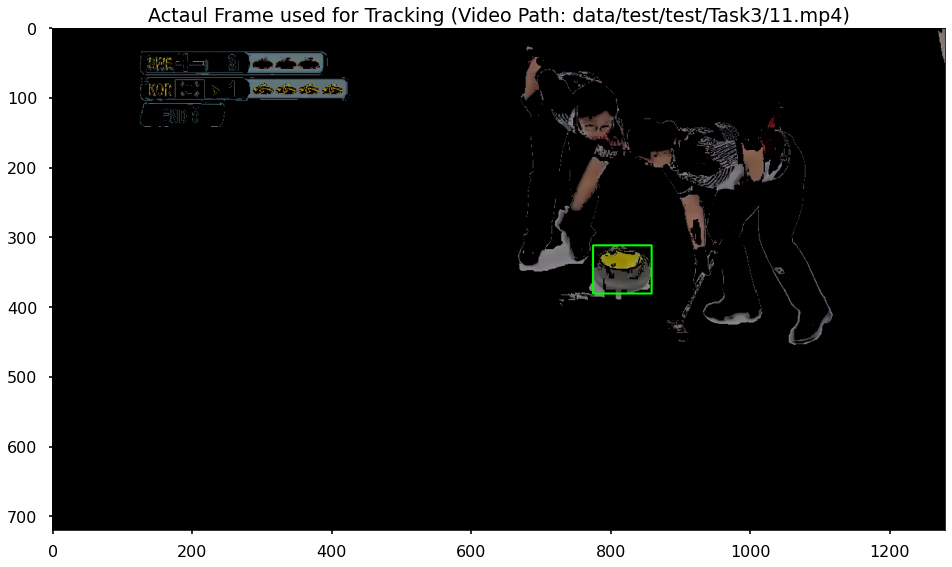

data/test/test/Task3/12.mp4


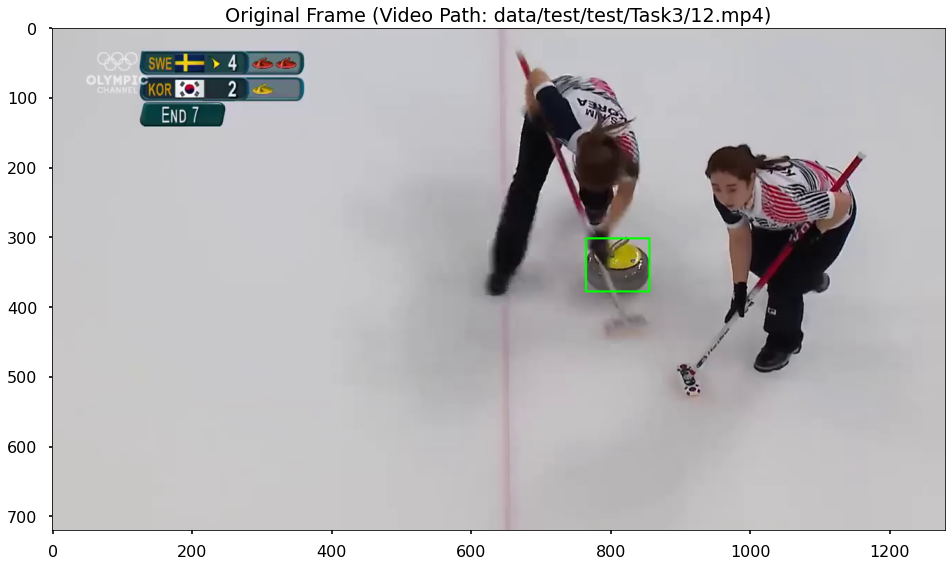

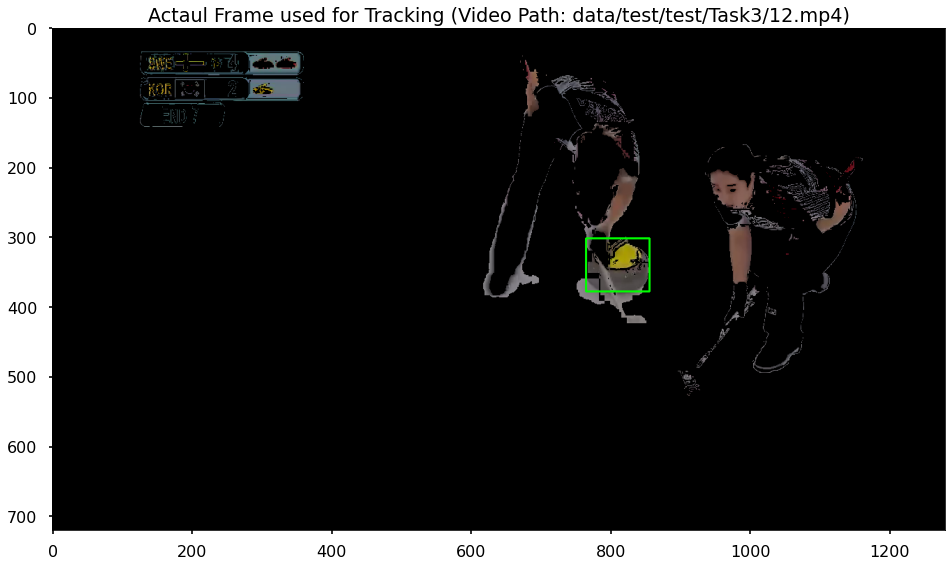

data/test/test/Task3/13.mp4


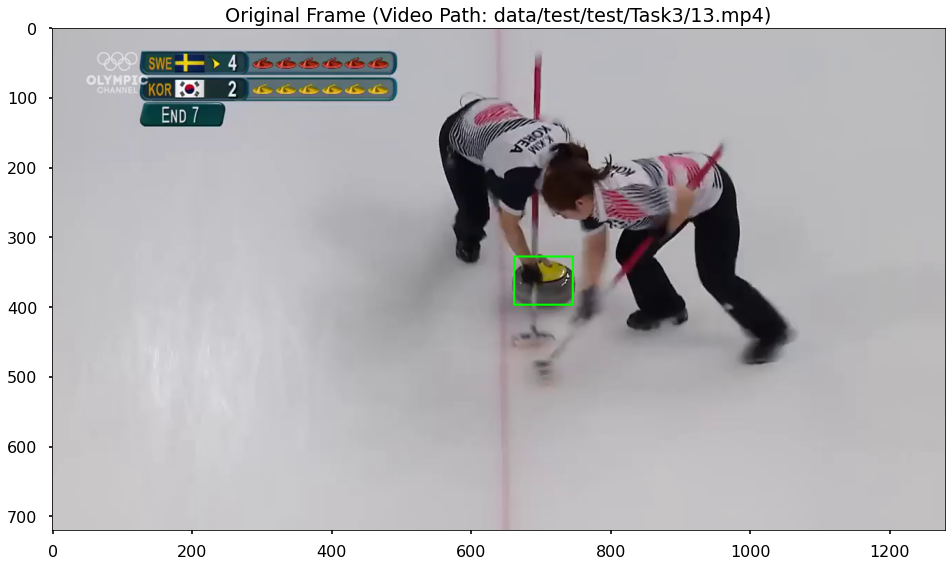

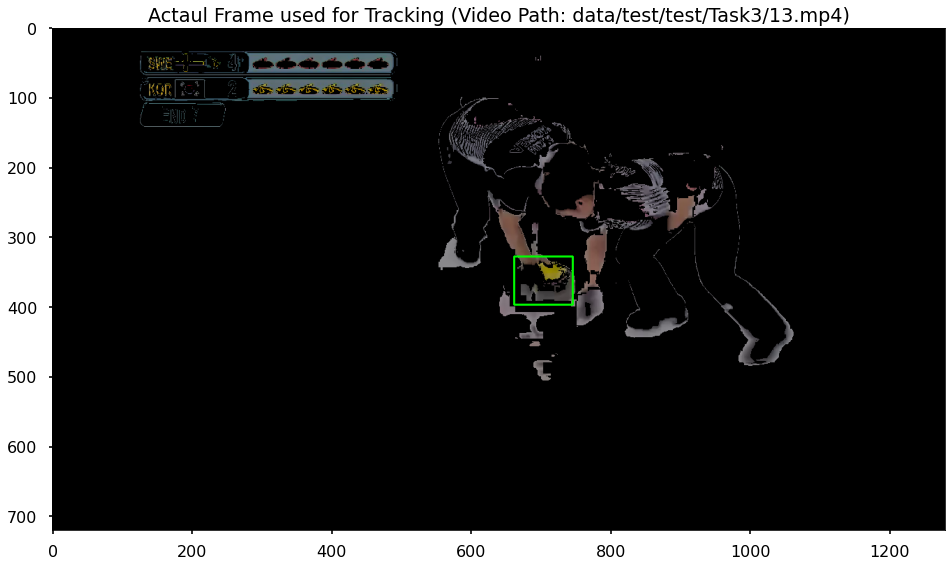

data/test/test/Task3/14.mp4


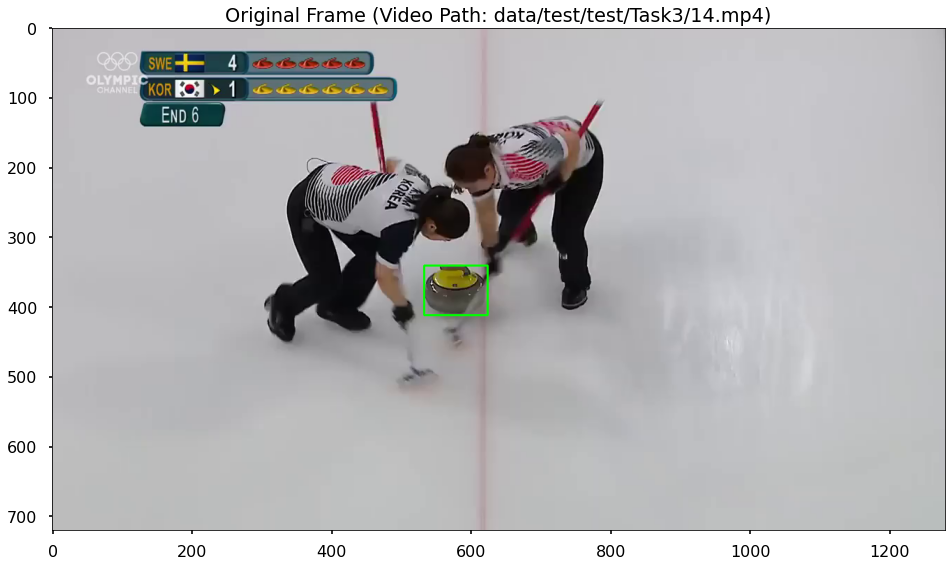

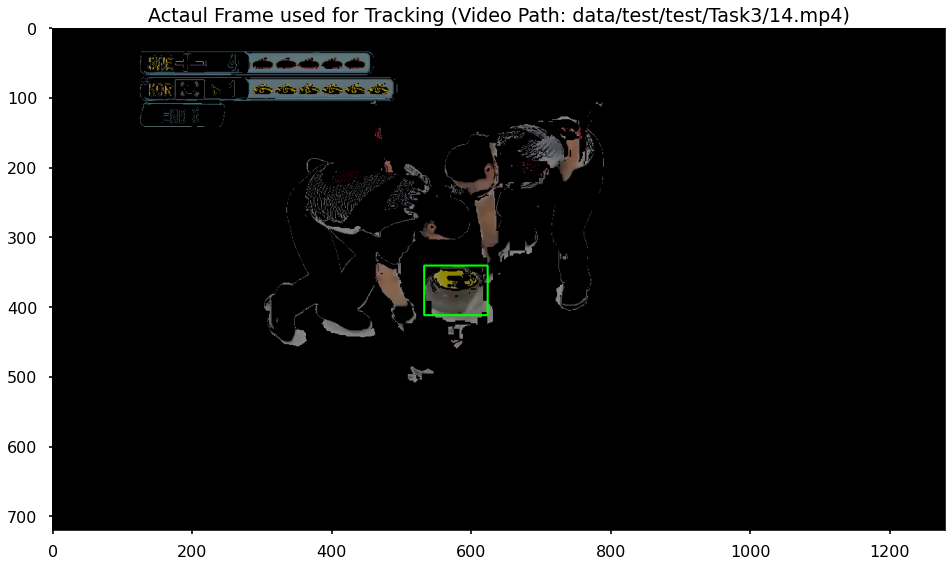

data/test/test/Task3/15.mp4


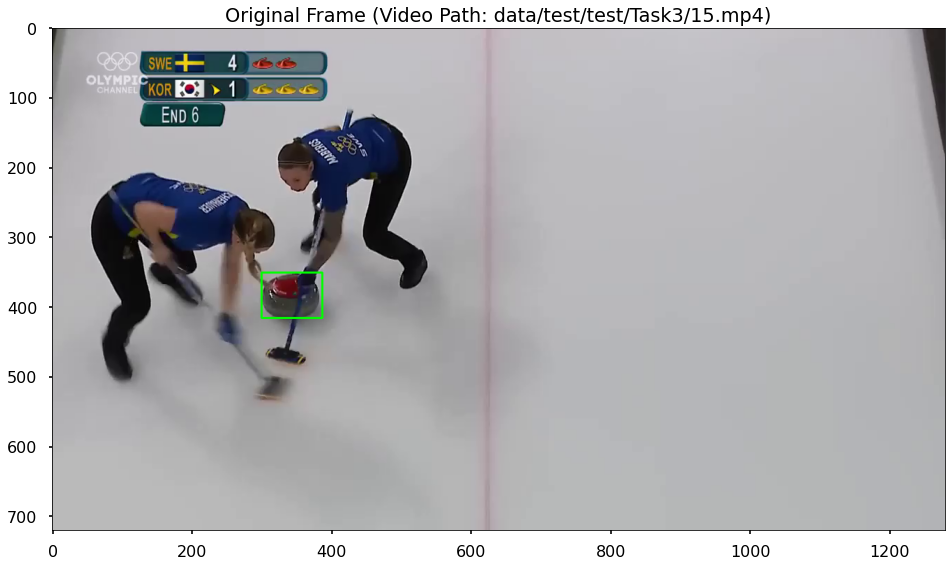

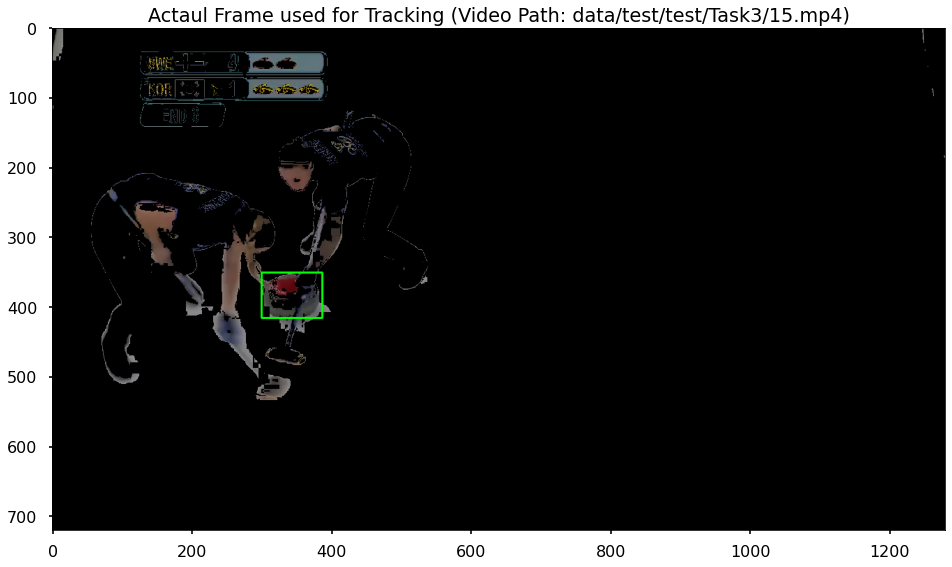

data/test/test/Task3/2.mp4


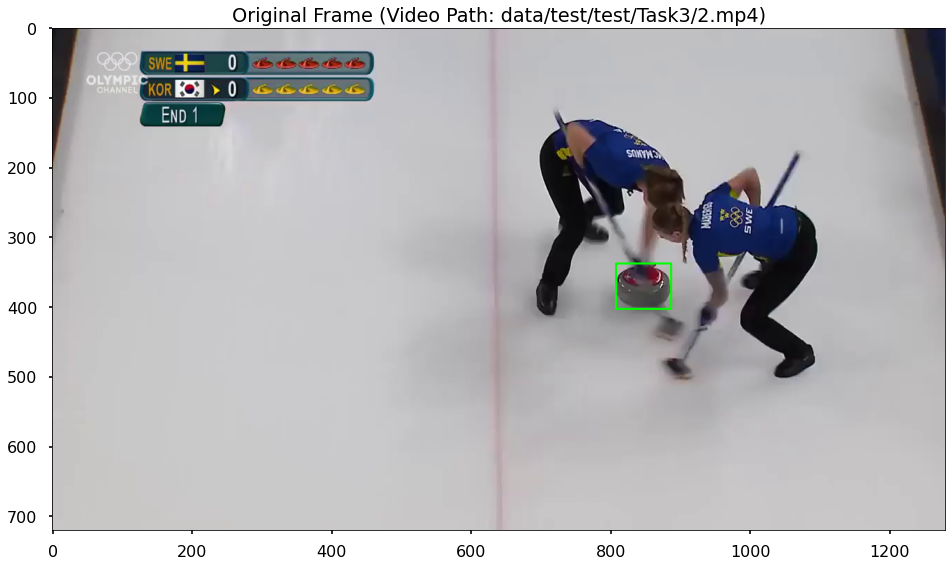

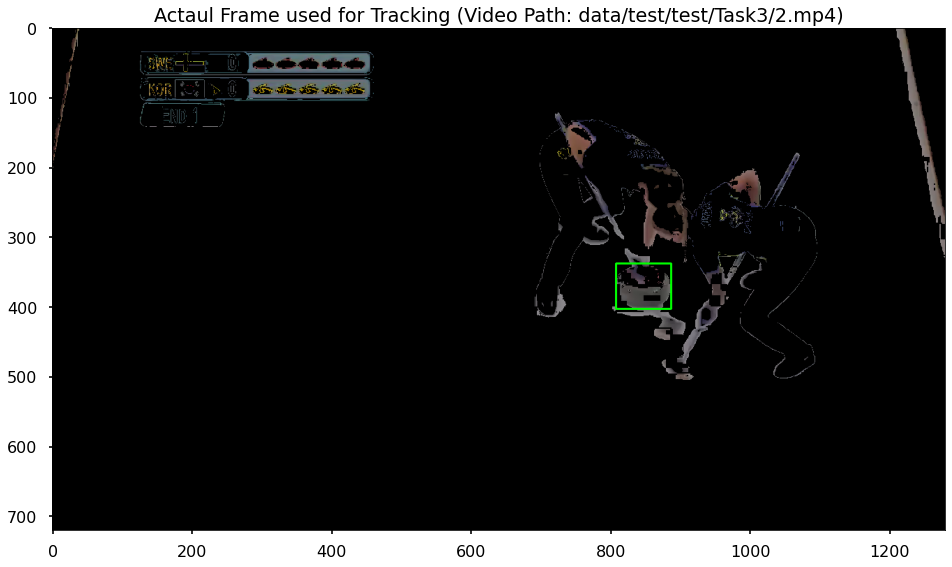

data/test/test/Task3/3.mp4


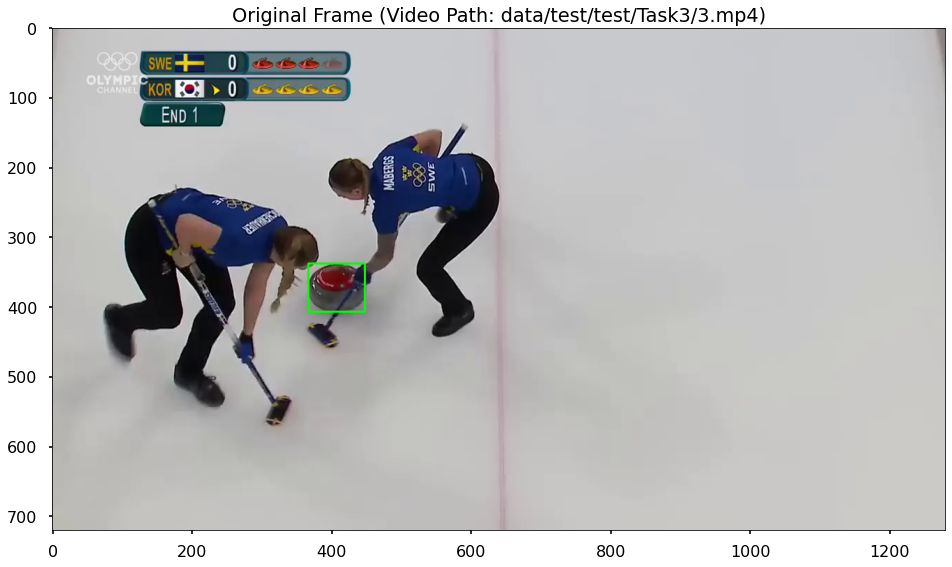

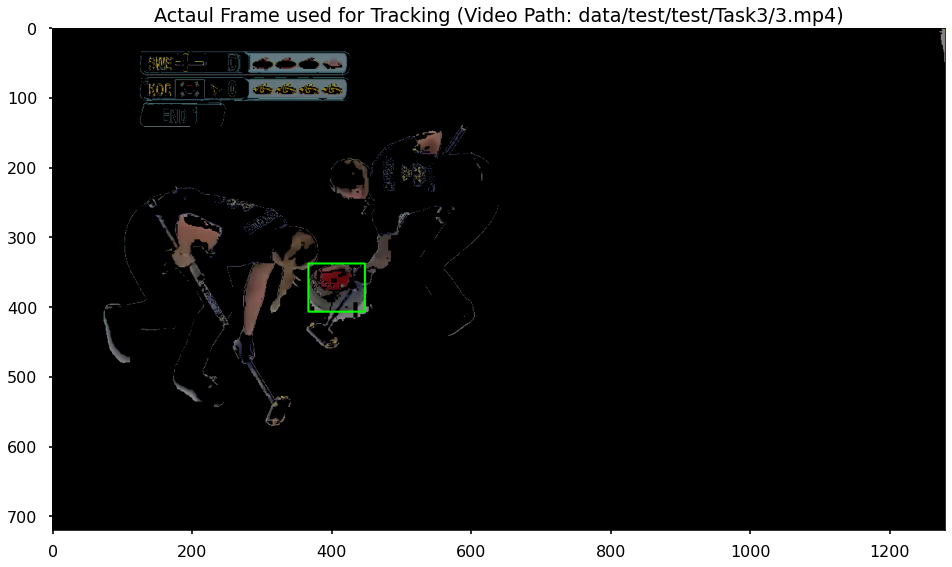

data/test/test/Task3/4.mp4


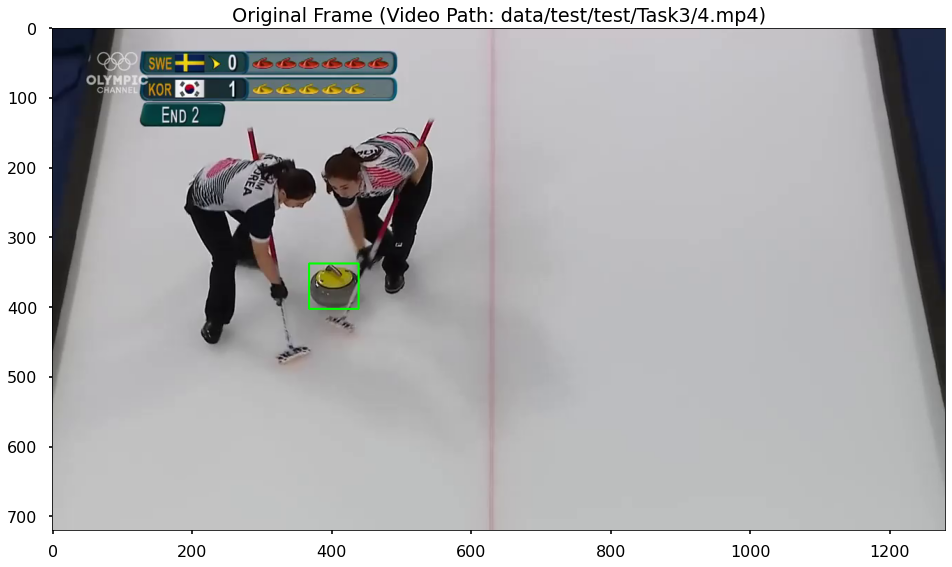

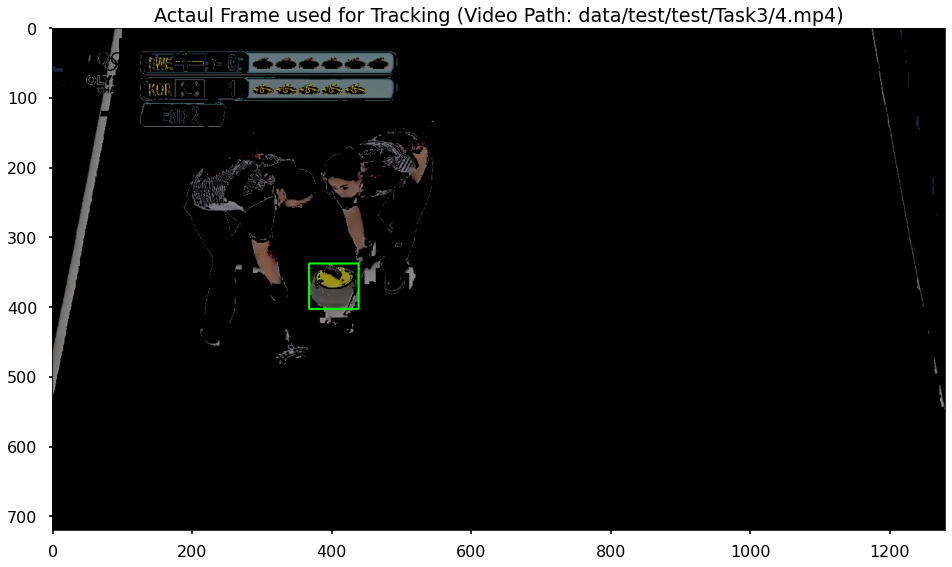

data/test/test/Task3/5.mp4


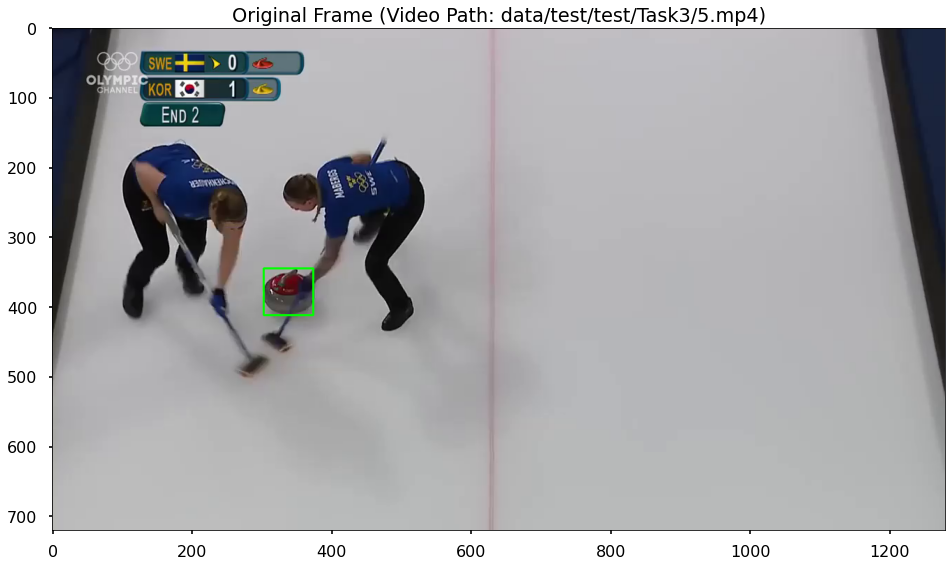

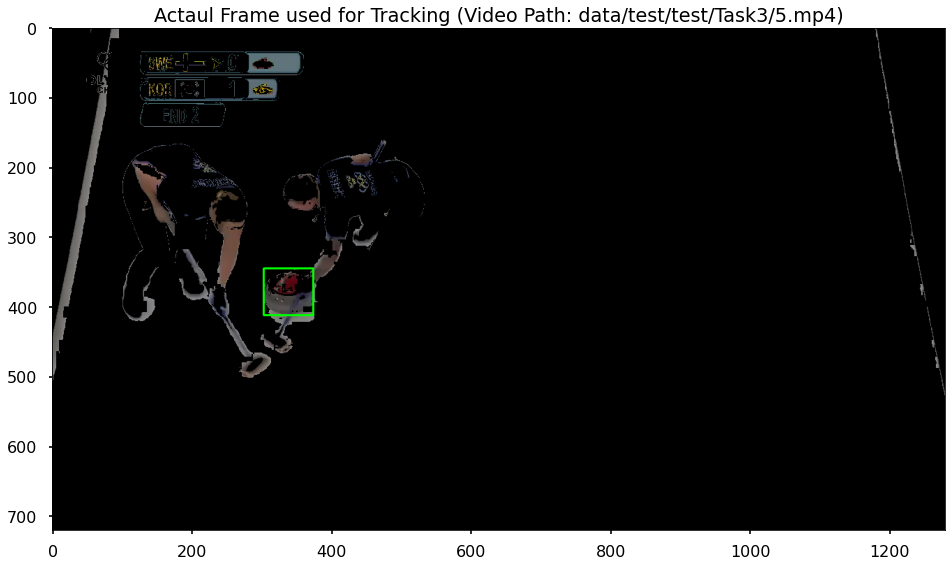

data/test/test/Task3/6.mp4


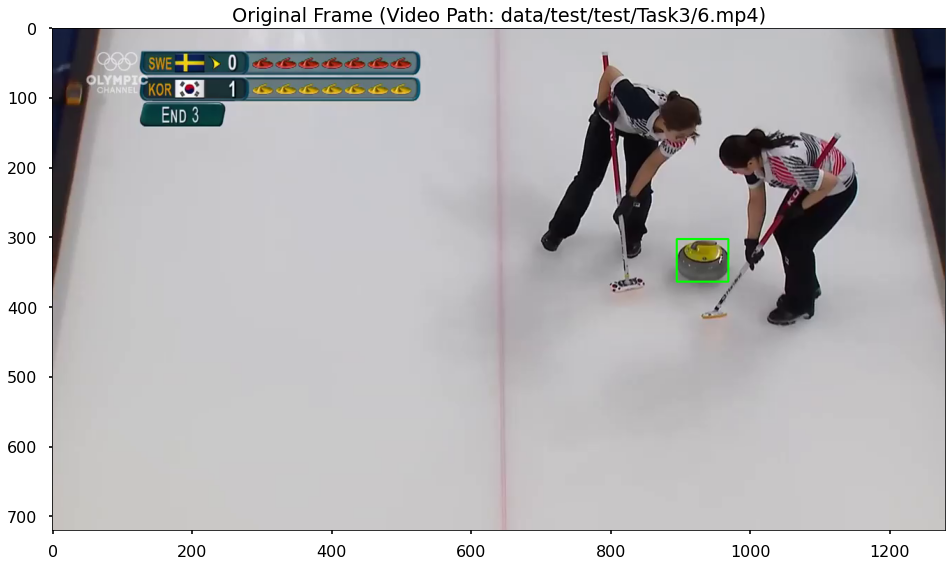

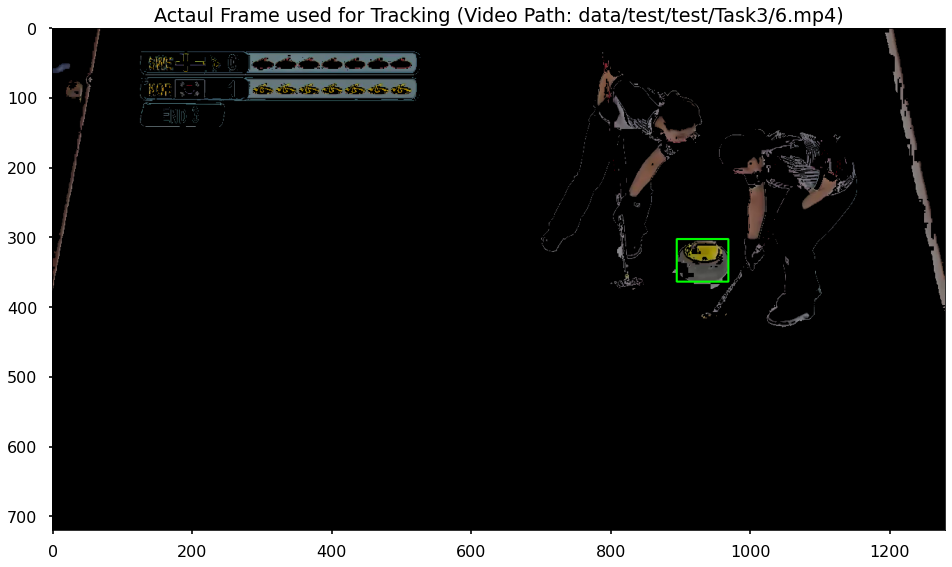

data/test/test/Task3/7.mp4


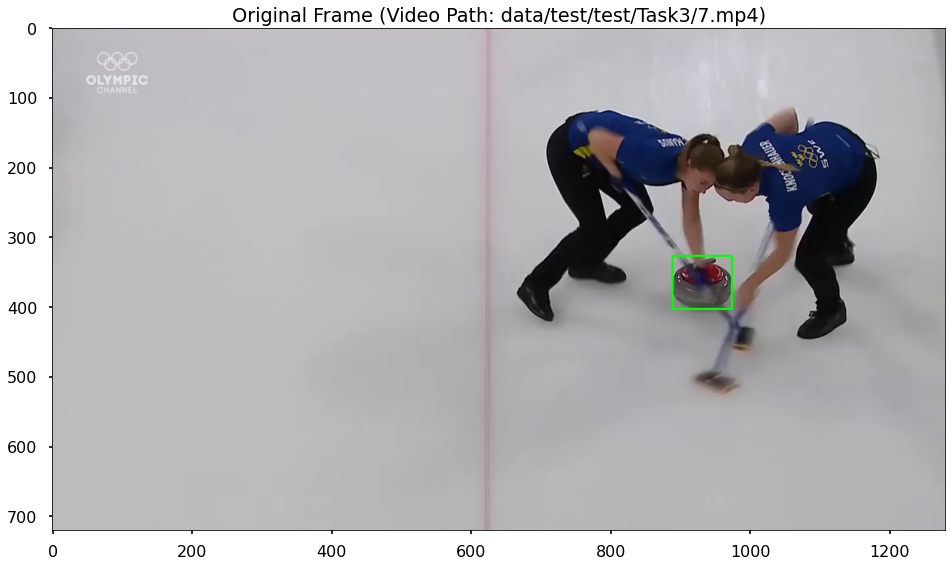

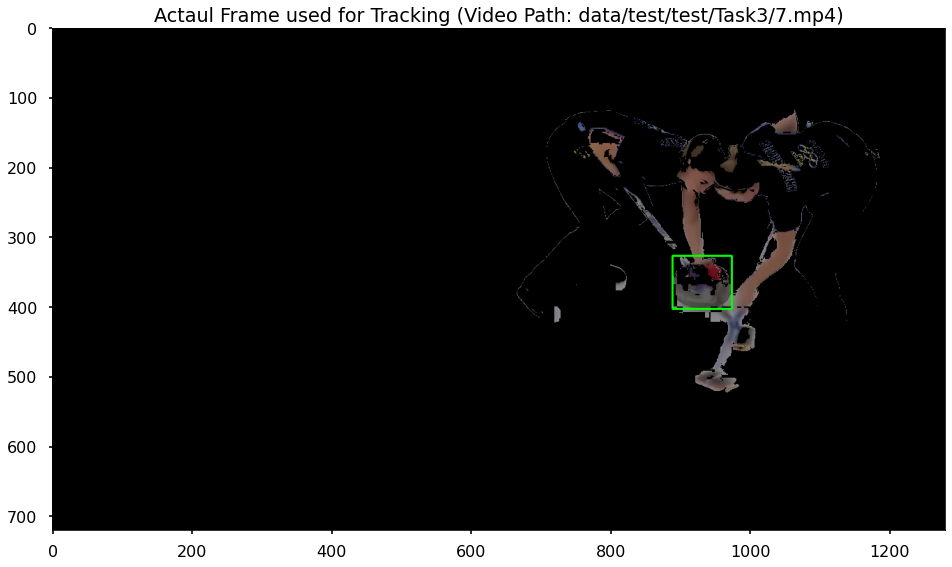

data/test/test/Task3/8.mp4


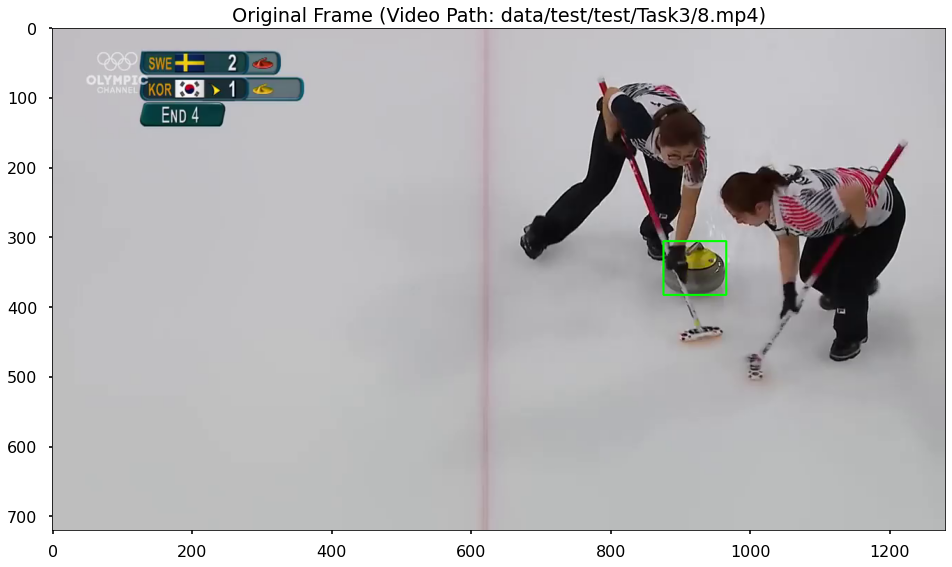

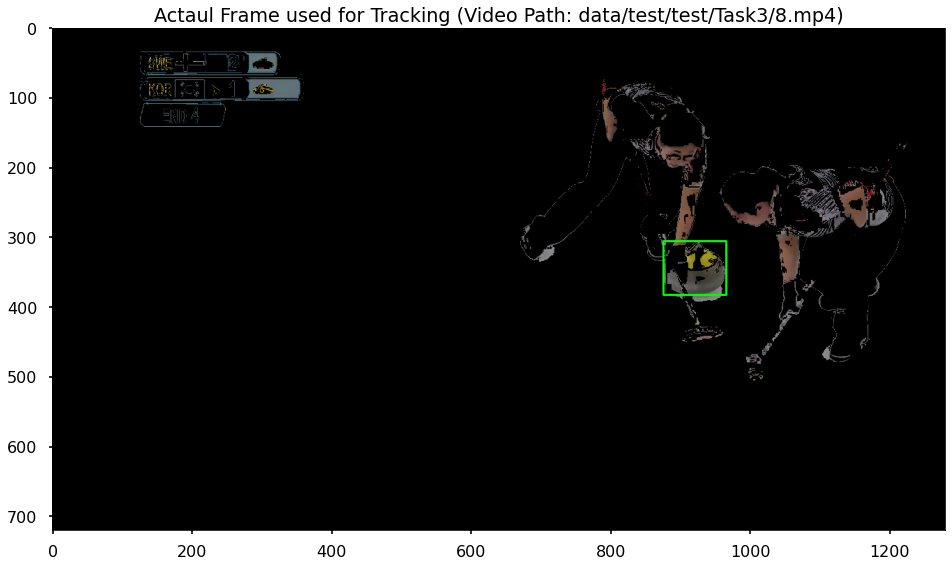

data/test/test/Task3/9.mp4


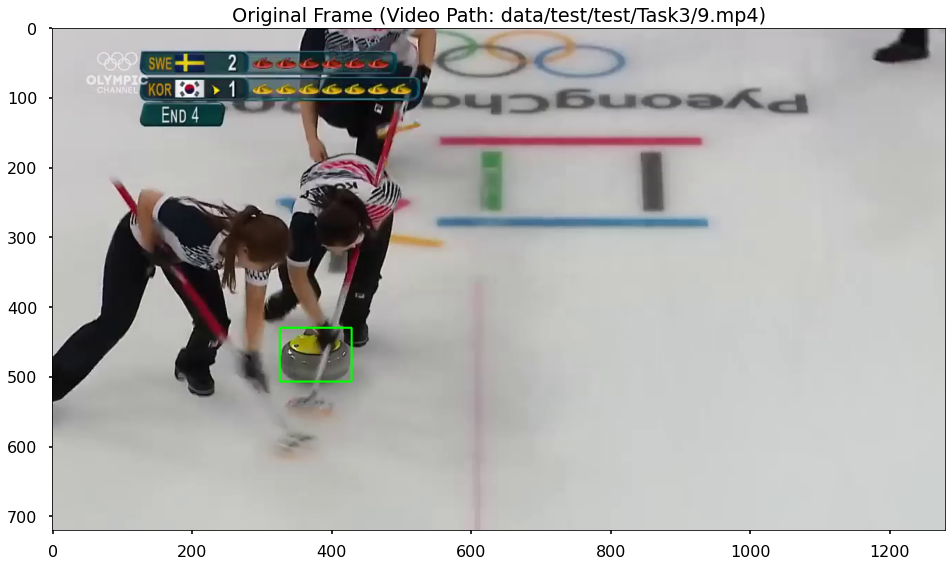

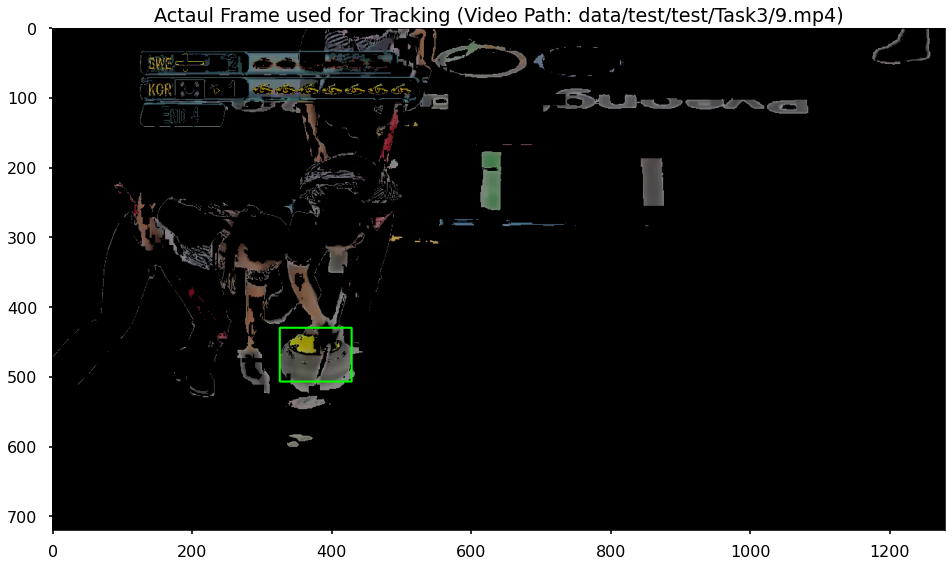

In [8]:
TASK = 3
PATH_TO_DATA = 'data/'
PATH_TO_VIDEOS = 'data/test/test/Task{}/'.format(TASK)
PATH_TO_PREDICTIONS = 'data/test/predictions/Task{}/'.format(TASK)

run_task_three(PATH_TO_VIDEOS, PATH_TO_PREDICTIONS, verbose = VERBOSE, evaluate = False)